# Preprocess the Datasets

Preprocessing Pipeline for Knee Osteoporosis Detection

We preprocess X-ray images of the knee to improve classification performance for detecting Normal, Osteopenia, and Osteoporosis conditions.

There is two Datasets - 
1. The first without metabolic data will use us for train/validation.
2. The second dataset, with metabolic data, will use us for test.

   
The preprocessing consists of four main steps - 

1.	Removing Duplicates – Identifying and eliminating duplicate images to ensure data integrity - in both dataset. 
2.	Cropping the Knee Joint – Using a YOLO model to focus on the relevant region in the X-ray.
3.	Data Augmentation – Applying transformations to improve model generalization.
4.	X-ray Enhancement – Utilizing contrast enhancement and pseudo-coloring techniques to emphasize bone structures.

Each step produces a new dataset version, maintaining the class structure. 

### First dataset -  Train and validation Dataset Distribution Before Preprocessing


📊 **Dataset Statistics After Before Preprocessing:**
  📂 Normal: 780 images
  📂 Osteopenia: 374 images
  📂 Osteoporosis: 793 images


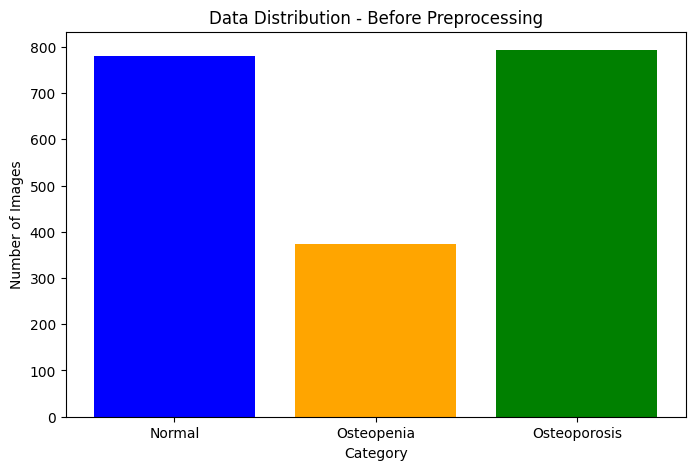

In [12]:
import os
import matplotlib.pyplot as plt

# Define dataset path
dataset_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/ROOT_DATASETS/OS Collected Data"
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Function to print dataset statistics
def dataset_statistics(dataset_path, step_name):
    """Prints the total number of images in each category."""
    print(f"\n📊 **Dataset Statistics After {step_name}:**")
    counts = {}
    for category in categories:
        category_path = os.path.join(dataset_path, category)
        num_images = len(os.listdir(category_path)) if os.path.exists(category_path) else 0
        counts[category] = num_images
        print(f"  📂 {category}: {num_images} images")

    # Plot bar chart
    plt.figure(figsize=(8, 5))
    plt.bar(counts.keys(), counts.values(), color=["blue", "orange", "green"])
    plt.title(f"Data Distribution - {step_name}")
    plt.ylabel("Number of Images")
    plt.xlabel("Category")
    plt.show()

# Show initial dataset distribution
dataset_statistics(dataset_path, "Before Preprocessing")

### Step 1 - Remove Duplicates

Processing Osteoporosis: 100%|██████████| 793/793 [00:04<00:00, 160.57it/s]


✅ Step 1 Complete: 1221 duplicate images removed.

📊 **Dataset Statistics After Step 1 - Duplicate Removal:**
  📂 Normal: 287 images
  📂 Osteopenia: 234 images
  📂 Osteoporosis: 205 images


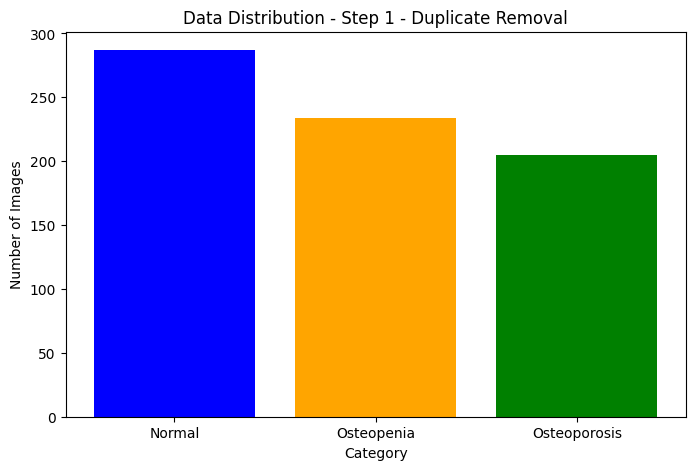

In [13]:
import imagehash
from PIL import Image
import shutil
from collections import defaultdict
from tqdm import tqdm

# Paths
output_path_step1 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_1_removed_duplicates"

def analyze_and_remove_duplicates(input_path, output_path):
    """Removes duplicate images using perceptual hashing."""
    hashes = {}
    duplicates_removed = 0

    # Create output directory structure
    for category in categories:
        os.makedirs(os.path.join(output_path, category), exist_ok=True)

    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        for img_name in tqdm(os.listdir(category_path), desc=f"Processing {category}"):
            img_path = os.path.join(category_path, img_name)
            try:
                img = Image.open(img_path).convert("L")  # Convert to grayscale
                img_hash = imagehash.phash(img)  # Compute perceptual hash

                if img_hash in hashes:
                    duplicates_removed += 1
                else:
                    hashes[img_hash] = img_path
                    shutil.copy(img_path, os.path.join(output_category_path, img_name))
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

    print(f"\n✅ Step 1 Complete: {duplicates_removed} duplicate images removed.")

# Run Step 1
analyze_and_remove_duplicates(dataset_path, output_path_step1)
dataset_statistics(output_path_step1, "Step 1 - Duplicate Removal")

In [ ]:
import random
from PIL import Image

def show_sample_images(dataset_path, step_name):
    """Displays 3 sample images from each category."""
    fig, axes = plt.subplots(len(categories), 3, figsize=(12, 8))

    for row, category in enumerate(categories):
        category_path = os.path.join(dataset_path, category)
        images = os.listdir(category_path)

        for col in range(3):
            if images:
                img_path = os.path.join(category_path, random.choice(images))
                img = Image.open(img_path)

                axes[row, col].imshow(img, cmap="gray")
                axes[row, col].axis("off")
                axes[row, col].set_title(f"{category}")

    plt.suptitle(f"Sample Images - {step_name}")
    plt.tight_layout()
    plt.show()

show_sample_images(output_path_step1, "Step 1 - Removed Duplicates")

NameError: name 'output_path_step1' is not defined

: 

### Step 2 - Crop Knee Joint Using YOLO

#### Knee Joint Identication

In [10]:
import random
import glob
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image

# Load YOLO model
model_path = "/Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo_run/weights/best.onnx"
model = YOLO(model_path)

# Get all image file paths from Step 1 (after duplicate removal)
image_paths = glob.glob(output_path_step1 + "/*/*.png")  # Adjust for multiple categories

# Ensure there are enough images in the folder
if len(image_paths) == 0:
    print("❌ No images found in the specified folder. Please check the path or file types.")
else:
    # Select 10 random images (or less if there are fewer than 10)
    random_images = random.sample(image_paths, min(10, len(image_paths)))

    # Plot YOLO Predictions
    fig, axes = plt.subplots(2, 5, figsize=(20, 8))  # 2 rows, 5 columns for 10 images

    for ax, image_path in zip(axes.flatten(), random_images):
        results = model(image_path)  # Run YOLO on the image
        result_img = results[0].plot()  # Get the annotated image

        ax.imshow(result_img)  # Display the image with bounding boxes
        ax.set_title(image_path.split("/")[-1])  # Show image filename
        ax.axis("off")  # Hide axes

    plt.tight_layout()
    plt.show()

FileNotFoundError: '/Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo_run/weights/best.onnx' does not exist

#### Identication and Display All Cropped Knees - 1, 2 knee joints per Xray

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Loading /Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo_run/weights/best.onnx for ONNX Runtime inference...
Using ONNX Runtime CPUExecutionProvider

0: 640x640 2 knees, 51.1ms
Speed: 3.7ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.4ms
Speed: 2.3ms preprocess, 45.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.1ms
Speed: 2.7ms preprocess, 36.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.8ms
Speed: 3.8ms preprocess, 34.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 39.6ms
Speed: 2.6ms preprocess, 39.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


/var/folders/x8/3sd1f18n12b332zmvb89nvp80000gn/T/ipykernel_38718/4156058061.py:90: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


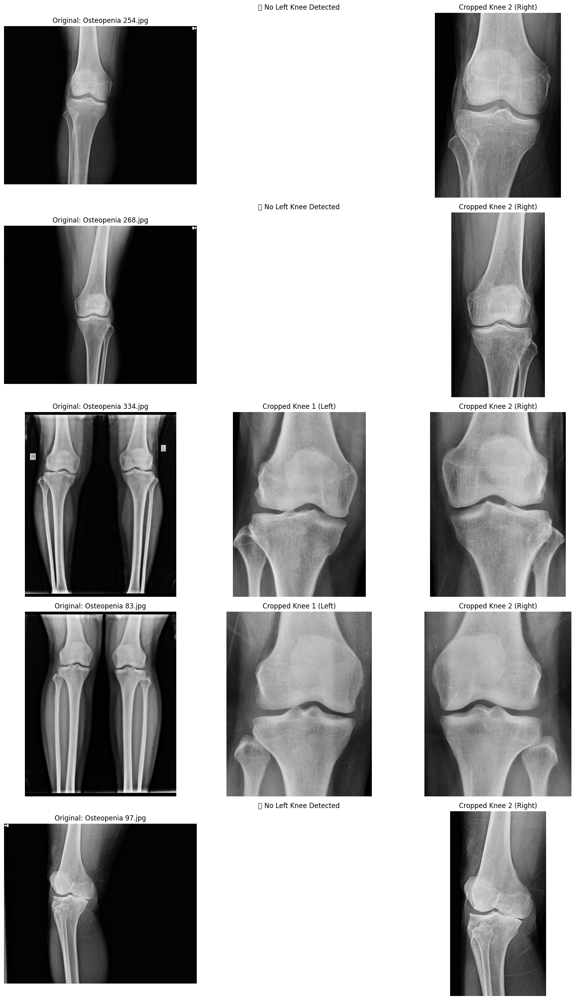

In [ ]:
import glob
import cv2
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load YOLO model
model_path = "/Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo_run/weights/best.onnx"
model = YOLO(model_path)

# Path to Osteopenia images from Step 1
osteopenia_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_1_removed_duplicates/Osteopenia"

# Find all images, supporting multiple formats
image_extensions = ["jpg", "jpeg", "png", "bmp", "tiff"]
image_paths = []
for ext in image_extensions:
    image_paths.extend(glob.glob(os.path.join(osteopenia_path, f"*.{ext}")))

# Select up to 5 images
num_images = min(5, len(image_paths))

if num_images == 0:
    print("⚠️ No images found! Check the folder path or file formats.")
else:
    selected_images = image_paths[:num_images]

    # Create figure dynamically
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))  # 3 columns: Original + 2 Crops

    for i, img_path in enumerate(selected_images):
        image = cv2.imread(img_path)
        if image is None:
            print(f"⚠️ Cannot read image: {img_path}")
            continue

        results = model(image)

        # Plot the original image
        axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original: {os.path.basename(img_path)}")
        axes[i, 0].axis("off")

        # Extract all detected knees
        cropped_knees = []
        confidences = []
        width_threshold = image.shape[1] // 2  # Half of image width

        for result in results:
            for box in result.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                confidence = box.conf[0].item()

                cropped_knee = image[y1:y2, x1:x2]

                # Store only if valid
                if cropped_knee.size != 0:
                    cropped_knees.append((cropped_knee, confidence, x1, x2))

        # **Filter detections**
        left_knee, right_knee = None, None
        left_conf, right_conf = 0, 0

        for knee, conf, x1, x2 in cropped_knees:
            # Classify as LEFT or RIGHT knee
            if x2 < width_threshold:  # Left side of image
                if conf > left_conf:
                    left_knee, left_conf = knee, conf
            else:  # Right side of image
                if conf > right_conf:
                    right_knee, right_conf = knee, conf

        # Show cropped knees
        if left_knee is not None:
            axes[i, 1].imshow(cv2.cvtColor(left_knee, cv2.COLOR_BGR2RGB))
            axes[i, 1].set_title(f"Cropped Knee 1 (Left)")
            axes[i, 1].axis("off")
        else:
            axes[i, 1].set_title("❌ No Left Knee Detected")
            axes[i, 1].axis("off")

        if right_knee is not None:
            axes[i, 2].imshow(cv2.cvtColor(right_knee, cv2.COLOR_BGR2RGB))
            axes[i, 2].set_title(f"Cropped Knee 2 (Right)")
            axes[i, 2].axis("off")
        else:
            axes[i, 2].set_title("❌ No Right Knee Detected")
            axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

#### Cropping the knee joints

In [3]:
import glob
import cv2
import os
from tqdm import tqdm
from ultralytics import YOLO

# Load YOLO model
model_path = "/Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo/yolo_run/weights/best.onnx"
model = YOLO(model_path)

# Paths
input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_1_removed_duplicates"
output_path_step2 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_square_adaptive_knee"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Ensure output directories exist
for category in categories:
    os.makedirs(os.path.join(output_path_step2, category), exist_ok=True)

def adaptive_centered_square_crop(image, x1, y1, x2, y2, output_size=224):
    """Crop a square around the center of the YOLO box using avg(width, height), then resize to output_size."""
    h, w, _ = image.shape
    x_center = (x1 + x2) // 2
    y_center = (y1 + y2) // 2

    box_w = x2 - x1
    box_h = y2 - y1
    crop_size = int((box_w + box_h) / 2)
    half_crop = crop_size // 2

    x1_crop = max(0, x_center - half_crop)
    y1_crop = max(0, y_center - half_crop)
    x2_crop = min(w, x_center + half_crop)
    y2_crop = min(h, y_center + half_crop)

    cropped = image[y1_crop:y2_crop, x1_crop:x2_crop]

    # Pad if smaller than crop_size (due to borders)
    pad_top = (crop_size - cropped.shape[0]) // 2
    pad_bottom = (crop_size - cropped.shape[0] + 1) // 2
    pad_left = (crop_size - cropped.shape[1]) // 2
    pad_right = (crop_size - cropped.shape[1] + 1) // 2

    padded = cv2.copyMakeBorder(
        cropped,
        pad_top,
        pad_bottom,
        pad_left,
        pad_right,
        borderType=cv2.BORDER_CONSTANT,
        value=[0, 0, 0],
    )

    # Resize to model input size
    resized = cv2.resize(padded, (output_size, output_size))
    return resized

def crop_and_save_knees(input_path, output_path):
    """Uses YOLO to detect and save square knee crops using avg(w,h) with resize to 224x224."""
    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        # Get all images
        image_extensions = ["jpg", "jpeg", "png", "bmp", "tiff"]
        image_paths = []
        for ext in image_extensions:
            image_paths.extend(glob.glob(os.path.join(category_path, f"*.{ext}")))

        print(f"📂 Processing {category} - {len(image_paths)} images")

        for img_path in tqdm(image_paths, desc=f"Cropping {category}"):
            image = cv2.imread(img_path)
            if image is None:
                print(f"⚠️ Skipping unreadable image: {img_path}")
                continue

            results = model(image)
            cropped_knees = []
            width_threshold = image.shape[1] // 2

            for result in results:
                for box in result.boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    confidence = box.conf[0].item()

                    cropped = adaptive_centered_square_crop(image, x1, y1, x2, y2)

                    if cropped.size != 0:
                        cropped_knees.append((cropped, confidence, x1, x2))

            # Separate left and right knees
            left_knee, right_knee = None, None
            left_conf, right_conf = 0, 0

            for knee, conf, x1, x2 in cropped_knees:
                if x2 < width_threshold:
                    if conf > left_conf:
                        left_knee, left_conf = knee, conf
                else:
                    if conf > right_conf:
                        right_knee, right_conf = knee, conf

            # Save cropped knees
            base_filename = os.path.basename(img_path)
            filename_no_ext, ext = os.path.splitext(base_filename)

            if left_knee is not None:
                left_output_path = os.path.join(output_category_path, f"{filename_no_ext}_left{ext}")
                cv2.imwrite(left_output_path, left_knee)

            if right_knee is not None:
                right_output_path = os.path.join(output_category_path, f"{filename_no_ext}_right{ext}")
                cv2.imwrite(right_output_path, right_knee)

    print("\n✅ Step 2 Complete: Cropped knees saved with adaptive square logic.")

# Run it
crop_and_save_knees(input_path, output_path_step2)

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
📂 Processing Normal - 257 images


Cropping Normal:   0%|          | 0/257 [00:00<?, ?it/s]

Loading /Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo/yolo_run/weights/best.onnx for ONNX Runtime inference...
Using ONNX Runtime CPUExecutionProvider

0: 640x640 1 knee, 54.9ms
Speed: 2.6ms preprocess, 54.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.3ms
Speed: 1.5ms preprocess, 45.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   1%|          | 2/257 [00:00<00:19, 13.40it/s]


0: 640x640 1 knee, 43.1ms
Speed: 1.7ms preprocess, 43.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.5ms
Speed: 1.8ms preprocess, 34.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   2%|▏         | 4/257 [00:00<00:15, 16.45it/s]


0: 640x640 1 knee, 38.5ms
Speed: 1.7ms preprocess, 38.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.9ms
Speed: 2.4ms preprocess, 35.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.9ms
Speed: 1.7ms preprocess, 33.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   3%|▎         | 7/257 [00:00<00:13, 19.17it/s]


0: 640x640 1 knee, 37.3ms
Speed: 2.2ms preprocess, 37.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 35.5ms
Speed: 1.3ms preprocess, 35.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.4ms
Speed: 1.6ms preprocess, 37.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   4%|▍         | 10/257 [00:00<00:12, 20.47it/s]


0: 640x640 1 knee, 43.5ms
Speed: 1.3ms preprocess, 43.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.3ms
Speed: 1.2ms preprocess, 38.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.1ms
Speed: 1.2ms preprocess, 36.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   5%|▌         | 13/257 [00:00<00:11, 21.19it/s]


0: 640x640 1 knee, 38.9ms
Speed: 2.2ms preprocess, 38.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.7ms
Speed: 3.8ms preprocess, 35.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.4ms
Speed: 1.2ms preprocess, 45.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   6%|▌         | 16/257 [00:00<00:11, 20.51it/s]


0: 640x640 1 knee, 66.0ms
Speed: 1.5ms preprocess, 66.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.3ms
Speed: 1.5ms preprocess, 37.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   7%|▋         | 19/257 [00:00<00:12, 19.22it/s]


0: 640x640 1 knee, 39.5ms
Speed: 1.2ms preprocess, 39.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.2ms
Speed: 1.2ms preprocess, 41.2ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.7ms
Speed: 1.2ms preprocess, 40.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   9%|▊         | 22/257 [00:01<00:11, 19.83it/s]


0: 640x640 1 knee, 39.7ms
Speed: 1.3ms preprocess, 39.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.5ms
Speed: 1.7ms preprocess, 37.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.9ms
Speed: 1.2ms preprocess, 37.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  10%|▉         | 25/257 [00:01<00:11, 20.41it/s]


0: 640x640 1 knee, 44.6ms
Speed: 1.2ms preprocess, 44.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.5ms
Speed: 1.6ms preprocess, 37.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.0ms
Speed: 2.2ms preprocess, 39.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  11%|█         | 28/257 [00:01<00:11, 20.14it/s]


0: 640x640 1 knee, 37.6ms
Speed: 1.2ms preprocess, 37.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.9ms
Speed: 1.9ms preprocess, 34.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 48.8ms
Speed: 1.9ms preprocess, 48.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  12%|█▏        | 31/257 [00:01<00:11, 19.95it/s]


0: 640x640 1 knee, 45.0ms
Speed: 1.2ms preprocess, 45.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.9ms
Speed: 1.4ms preprocess, 41.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.2ms
Speed: 2.2ms preprocess, 42.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  13%|█▎        | 34/257 [00:01<00:11, 19.78it/s]


0: 640x640 (no detections), 40.1ms
Speed: 1.3ms preprocess, 40.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.3ms
Speed: 2.0ms preprocess, 39.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.7ms
Speed: 1.5ms preprocess, 40.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  14%|█▍        | 37/257 [00:01<00:10, 20.10it/s]


0: 640x640 1 knee, 44.6ms
Speed: 1.4ms preprocess, 44.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 41.5ms
Speed: 1.2ms preprocess, 41.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.1ms
Speed: 1.3ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  16%|█▌        | 40/257 [00:02<00:10, 20.23it/s]


0: 640x640 1 knee, 43.1ms
Speed: 2.2ms preprocess, 43.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.1ms
Speed: 1.1ms preprocess, 44.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.7ms
Speed: 1.4ms preprocess, 43.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  17%|█▋        | 43/257 [00:02<00:10, 19.71it/s]


0: 640x640 1 knee, 64.5ms
Speed: 2.9ms preprocess, 64.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.9ms
Speed: 2.2ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  18%|█▊        | 45/257 [00:02<00:11, 18.19it/s]


0: 640x640 1 knee, 44.5ms
Speed: 1.2ms preprocess, 44.5ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.3ms
Speed: 1.5ms preprocess, 41.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  18%|█▊        | 47/257 [00:02<00:11, 18.18it/s]


0: 640x640 1 knee, 40.3ms
Speed: 1.4ms preprocess, 40.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.4ms
Speed: 1.2ms preprocess, 38.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.3ms
Speed: 1.3ms preprocess, 40.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  19%|█▉        | 50/257 [00:02<00:10, 19.40it/s]


0: 640x640 1 knee, 47.3ms
Speed: 2.0ms preprocess, 47.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.6ms
Speed: 1.8ms preprocess, 44.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  20%|██        | 52/257 [00:02<00:11, 18.16it/s]


0: 640x640 (no detections), 40.0ms
Speed: 1.5ms preprocess, 40.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.6ms
Speed: 1.4ms preprocess, 39.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.7ms
Speed: 1.0ms preprocess, 40.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  21%|██▏       | 55/257 [00:02<00:10, 19.36it/s]


0: 640x640 1 knee, 43.7ms
Speed: 1.2ms preprocess, 43.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.0ms
Speed: 1.8ms preprocess, 41.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.6ms
Speed: 1.5ms preprocess, 40.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  23%|██▎       | 58/257 [00:02<00:09, 19.99it/s]


0: 640x640 1 knee, 45.7ms
Speed: 1.6ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.3ms
Speed: 1.1ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  23%|██▎       | 60/257 [00:03<00:10, 19.36it/s]


0: 640x640 1 knee, 47.5ms
Speed: 1.3ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.9ms
Speed: 1.3ms preprocess, 42.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  24%|██▍       | 62/257 [00:03<00:09, 19.52it/s]


0: 640x640 1 knee, 47.6ms
Speed: 1.4ms preprocess, 47.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.7ms
Speed: 1.7ms preprocess, 38.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  25%|██▍       | 64/257 [00:03<00:10, 19.28it/s]


0: 640x640 1 knee, 40.7ms
Speed: 2.2ms preprocess, 40.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.7ms
Speed: 1.6ms preprocess, 43.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  26%|██▌       | 66/257 [00:03<00:10, 18.78it/s]


0: 640x640 1 knee, 71.0ms
Speed: 1.5ms preprocess, 71.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.3ms
Speed: 2.1ms preprocess, 44.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  26%|██▋       | 68/257 [00:03<00:10, 17.36it/s]


0: 640x640 1 knee, 43.7ms
Speed: 1.1ms preprocess, 43.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 43.6ms
Speed: 1.3ms preprocess, 43.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.6ms
Speed: 1.2ms preprocess, 44.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  28%|██▊       | 71/257 [00:03<00:10, 18.38it/s]


0: 640x640 1 knee, 44.1ms
Speed: 1.1ms preprocess, 44.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.9ms
Speed: 1.6ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.3ms
Speed: 1.3ms preprocess, 44.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  29%|██▉       | 74/257 [00:03<00:09, 19.04it/s]


0: 640x640 1 knee, 46.8ms
Speed: 1.9ms preprocess, 46.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 47.0ms
Speed: 1.3ms preprocess, 47.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  30%|██▉       | 76/257 [00:03<00:09, 18.64it/s]


0: 640x640 1 knee, 39.4ms
Speed: 1.7ms preprocess, 39.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.8ms
Speed: 1.3ms preprocess, 35.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.8ms
Speed: 2.0ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  31%|███       | 79/257 [00:04<00:09, 18.87it/s]


0: 640x640 1 knee, 42.0ms
Speed: 1.2ms preprocess, 42.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.7ms
Speed: 1.2ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.5ms
Speed: 1.2ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  32%|███▏      | 82/257 [00:04<00:08, 19.52it/s]


0: 640x640 1 knee, 51.8ms
Speed: 1.2ms preprocess, 51.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 40.9ms
Speed: 2.0ms preprocess, 40.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  33%|███▎      | 84/257 [00:04<00:09, 18.55it/s]


0: 640x640 1 knee, 46.4ms
Speed: 1.5ms preprocess, 46.4ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.8ms
Speed: 1.1ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  33%|███▎      | 86/257 [00:04<00:09, 18.70it/s]


0: 640x640 1 knee, 46.0ms
Speed: 1.4ms preprocess, 46.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  34%|███▍      | 88/257 [00:04<00:08, 18.89it/s]


0: 640x640 (no detections), 69.0ms
Speed: 1.4ms preprocess, 69.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.4ms
Speed: 1.3ms preprocess, 43.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  35%|███▌      | 90/257 [00:04<00:09, 18.05it/s]


0: 640x640 1 knee, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.8ms
Speed: 2.0ms preprocess, 39.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  36%|███▌      | 92/257 [00:04<00:08, 18.48it/s]


0: 640x640 1 knee, 43.2ms
Speed: 1.1ms preprocess, 43.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.8ms
Speed: 1.5ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.8ms
Speed: 2.0ms preprocess, 38.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  37%|███▋      | 95/257 [00:04<00:08, 18.85it/s]


0: 640x640 1 knee, 38.3ms
Speed: 2.4ms preprocess, 38.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 37.1ms
Speed: 2.0ms preprocess, 37.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  38%|███▊      | 97/257 [00:05<00:08, 18.83it/s]


0: 640x640 1 knee, 52.0ms
Speed: 1.3ms preprocess, 52.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.6ms
Speed: 1.8ms preprocess, 44.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  39%|███▊      | 99/257 [00:05<00:08, 18.30it/s]


0: 640x640 1 knee, 38.2ms
Speed: 2.1ms preprocess, 38.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.8ms
Speed: 1.2ms preprocess, 38.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  39%|███▉      | 101/257 [00:05<00:08, 18.75it/s]


0: 640x640 1 knee, 42.4ms
Speed: 1.5ms preprocess, 42.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.0ms
Speed: 1.4ms preprocess, 42.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.3ms
Speed: 1.8ms preprocess, 43.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  40%|████      | 104/257 [00:05<00:08, 19.06it/s]


0: 640x640 1 knee, 43.1ms
Speed: 1.3ms preprocess, 43.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.3ms
Speed: 1.4ms preprocess, 40.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.0ms
Speed: 2.0ms preprocess, 42.0ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  42%|████▏     | 107/257 [00:05<00:07, 19.26it/s]


0: 640x640 2 knees, 40.3ms
Speed: 2.1ms preprocess, 40.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.5ms
Speed: 1.4ms preprocess, 43.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  42%|████▏     | 109/257 [00:05<00:07, 19.18it/s]


0: 640x640 1 knee, 71.2ms
Speed: 1.2ms preprocess, 71.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 50.5ms
Speed: 1.2ms preprocess, 50.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  43%|████▎     | 111/257 [00:05<00:08, 17.91it/s]


0: 640x640 1 knee, 40.1ms
Speed: 1.3ms preprocess, 40.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.0ms
Speed: 1.2ms preprocess, 37.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.9ms
Speed: 1.1ms preprocess, 40.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  44%|████▍     | 114/257 [00:05<00:07, 19.19it/s]


0: 640x640 1 knee, 46.3ms
Speed: 2.0ms preprocess, 46.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 49.7ms
Speed: 1.2ms preprocess, 49.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  45%|████▌     | 116/257 [00:06<00:07, 18.48it/s]


0: 640x640 1 knee, 55.6ms
Speed: 1.2ms preprocess, 55.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.3ms
Speed: 1.4ms preprocess, 39.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  46%|████▌     | 118/257 [00:06<00:07, 18.48it/s]


0: 640x640 1 knee, 41.4ms
Speed: 1.6ms preprocess, 41.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.5ms
Speed: 1.4ms preprocess, 40.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  47%|████▋     | 120/257 [00:06<00:07, 18.43it/s]


0: 640x640 1 knee, 38.6ms
Speed: 1.8ms preprocess, 38.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.6ms
Speed: 1.3ms preprocess, 34.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.7ms
Speed: 1.8ms preprocess, 33.7ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  48%|████▊     | 123/257 [00:06<00:06, 19.22it/s]


0: 640x640 1 knee, 38.2ms
Speed: 1.2ms preprocess, 38.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.3ms
Speed: 1.2ms preprocess, 37.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 50.3ms
Speed: 1.2ms preprocess, 50.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  49%|████▉     | 126/257 [00:06<00:06, 19.82it/s]


0: 640x640 1 knee, 54.4ms
Speed: 2.4ms preprocess, 54.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.0ms
Speed: 1.2ms preprocess, 45.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  50%|████▉     | 128/257 [00:06<00:06, 18.91it/s]


0: 640x640 1 knee, 46.6ms
Speed: 2.7ms preprocess, 46.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 52.2ms
Speed: 1.6ms preprocess, 52.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  51%|█████     | 130/257 [00:06<00:06, 18.57it/s]


0: 640x640 1 knee, 74.1ms
Speed: 1.2ms preprocess, 74.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 42.6ms
Speed: 2.2ms preprocess, 42.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  51%|█████▏    | 132/257 [00:06<00:07, 16.51it/s]


0: 640x640 1 knee, 46.2ms
Speed: 2.4ms preprocess, 46.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.4ms
Speed: 1.9ms preprocess, 36.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  52%|█████▏    | 134/257 [00:07<00:07, 16.17it/s]


0: 640x640 1 knee, 33.3ms
Speed: 1.3ms preprocess, 33.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.0ms
Speed: 1.1ms preprocess, 39.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.3ms
Speed: 1.8ms preprocess, 32.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  53%|█████▎    | 137/257 [00:07<00:06, 18.08it/s]


0: 640x640 1 knee, 36.5ms
Speed: 1.1ms preprocess, 36.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.7ms
Speed: 1.5ms preprocess, 38.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.1ms
Speed: 1.3ms preprocess, 34.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  54%|█████▍    | 140/257 [00:07<00:06, 19.36it/s]


0: 640x640 1 knee, 33.5ms
Speed: 1.3ms preprocess, 33.5ms inference, 14.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.5ms
Speed: 2.0ms preprocess, 32.5ms inference, 22.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  55%|█████▌    | 142/257 [00:07<00:06, 18.67it/s]


0: 640x640 1 knee, 37.5ms
Speed: 18.2ms preprocess, 37.5ms inference, 11.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 44.4ms
Speed: 3.1ms preprocess, 44.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  56%|█████▌    | 144/257 [00:07<00:06, 16.23it/s]


0: 640x640 2 knees, 42.1ms
Speed: 2.4ms preprocess, 42.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.2ms
Speed: 2.0ms preprocess, 43.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  57%|█████▋    | 146/257 [00:07<00:07, 15.80it/s]


0: 640x640 1 knee, 51.0ms
Speed: 1.2ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.6ms
Speed: 1.9ms preprocess, 35.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  58%|█████▊    | 148/257 [00:07<00:06, 16.62it/s]


0: 640x640 1 knee, 39.9ms
Speed: 1.3ms preprocess, 39.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.2ms
Speed: 1.4ms preprocess, 35.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.0ms
Speed: 2.0ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  59%|█████▉    | 151/257 [00:08<00:05, 18.27it/s]


0: 640x640 1 knee, 53.8ms
Speed: 2.2ms preprocess, 53.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 32.4ms
Speed: 1.4ms preprocess, 32.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  60%|█████▉    | 153/257 [00:08<00:05, 18.46it/s]


0: 640x640 1 knee, 65.4ms
Speed: 1.9ms preprocess, 65.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.9ms
Speed: 1.3ms preprocess, 34.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  60%|██████    | 155/257 [00:08<00:05, 17.81it/s]


0: 640x640 1 knee, 35.7ms
Speed: 1.7ms preprocess, 35.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 40.1ms
Speed: 2.0ms preprocess, 40.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  61%|██████    | 157/257 [00:08<00:05, 17.85it/s]


0: 640x640 1 knee, 37.1ms
Speed: 1.8ms preprocess, 37.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.4ms
Speed: 1.5ms preprocess, 33.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.0ms
Speed: 1.5ms preprocess, 35.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  62%|██████▏   | 160/257 [00:08<00:04, 19.50it/s]


0: 640x640 1 knee, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.8ms
Speed: 1.2ms preprocess, 35.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.7ms
Speed: 1.4ms preprocess, 40.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  63%|██████▎   | 163/257 [00:08<00:04, 20.70it/s]


0: 640x640 1 knee, 37.3ms
Speed: 1.1ms preprocess, 37.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.7ms
Speed: 2.0ms preprocess, 35.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.4ms
Speed: 1.2ms preprocess, 32.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  65%|██████▍   | 166/257 [00:08<00:04, 21.35it/s]


0: 640x640 1 knee, 32.8ms
Speed: 2.6ms preprocess, 32.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.5ms
Speed: 1.4ms preprocess, 32.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.1ms
Speed: 1.9ms preprocess, 36.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  66%|██████▌   | 169/257 [00:08<00:04, 20.79it/s]


0: 640x640 1 knee, 39.7ms
Speed: 2.5ms preprocess, 39.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.0ms
Speed: 1.8ms preprocess, 33.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.9ms
Speed: 1.3ms preprocess, 33.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  67%|██████▋   | 172/257 [00:09<00:04, 20.94it/s]


0: 640x640 (no detections), 36.6ms
Speed: 1.3ms preprocess, 36.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.2ms
Speed: 1.7ms preprocess, 32.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.1ms
Speed: 1.3ms preprocess, 32.1ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  68%|██████▊   | 175/257 [00:09<00:03, 22.04it/s]


0: 640x640 1 knee, 50.6ms
Speed: 21.3ms preprocess, 50.6ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 71.8ms
Speed: 2.1ms preprocess, 71.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.1ms
Speed: 1.5ms preprocess, 41.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  69%|██████▉   | 178/257 [00:09<00:04, 18.61it/s]


0: 640x640 1 knee, 37.7ms
Speed: 3.1ms preprocess, 37.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.9ms
Speed: 1.9ms preprocess, 40.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  70%|███████   | 180/257 [00:09<00:04, 18.49it/s]


0: 640x640 2 knees, 47.0ms
Speed: 2.9ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.5ms
Speed: 1.9ms preprocess, 43.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  71%|███████   | 182/257 [00:09<00:04, 17.24it/s]


0: 640x640 1 knee, 40.3ms
Speed: 1.6ms preprocess, 40.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.9ms
Speed: 1.7ms preprocess, 34.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.7ms
Speed: 1.2ms preprocess, 31.7ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  72%|███████▏  | 185/257 [00:09<00:03, 19.05it/s]


0: 640x640 1 knee, 39.9ms
Speed: 2.1ms preprocess, 39.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.0ms
Speed: 1.6ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  73%|███████▎  | 187/257 [00:09<00:03, 19.10it/s]


0: 640x640 1 knee, 35.8ms
Speed: 1.2ms preprocess, 35.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.6ms
Speed: 1.4ms preprocess, 36.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.1ms
Speed: 1.5ms preprocess, 33.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  74%|███████▍  | 190/257 [00:10<00:03, 20.47it/s]


0: 640x640 1 knee, 38.2ms
Speed: 1.7ms preprocess, 38.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.9ms
Speed: 2.7ms preprocess, 33.9ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.1ms
Speed: 1.6ms preprocess, 32.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  75%|███████▌  | 193/257 [00:10<00:03, 20.22it/s]


0: 640x640 1 knee, 38.4ms
Speed: 1.4ms preprocess, 38.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 33.4ms
Speed: 1.3ms preprocess, 33.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.7ms
Speed: 1.4ms preprocess, 34.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  76%|███████▋  | 196/257 [00:10<00:02, 21.55it/s]


0: 640x640 1 knee, 60.2ms
Speed: 1.2ms preprocess, 60.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.7ms
Speed: 1.6ms preprocess, 33.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.9ms
Speed: 1.3ms preprocess, 32.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  77%|███████▋  | 199/257 [00:10<00:02, 21.35it/s]


0: 640x640 1 knee, 41.4ms
Speed: 1.1ms preprocess, 41.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.7ms
Speed: 1.9ms preprocess, 36.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.6ms
Speed: 1.3ms preprocess, 36.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  79%|███████▊  | 202/257 [00:10<00:02, 21.12it/s]


0: 640x640 (no detections), 35.6ms
Speed: 1.2ms preprocess, 35.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.4ms
Speed: 1.3ms preprocess, 32.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.7ms
Speed: 1.3ms preprocess, 35.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  80%|███████▉  | 205/257 [00:10<00:02, 20.27it/s]


0: 640x640 1 knee, 51.9ms
Speed: 1.7ms preprocess, 51.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.8ms
Speed: 1.9ms preprocess, 37.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 46.1ms
Speed: 1.9ms preprocess, 46.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  81%|████████  | 208/257 [00:10<00:02, 16.91it/s]


0: 640x640 1 knee, 44.7ms
Speed: 2.0ms preprocess, 44.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.2ms
Speed: 1.6ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  82%|████████▏ | 210/257 [00:11<00:03, 15.50it/s]


0: 640x640 1 knee, 42.2ms
Speed: 1.8ms preprocess, 42.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.2ms
Speed: 1.6ms preprocess, 38.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  82%|████████▏ | 212/257 [00:11<00:02, 15.48it/s]


0: 640x640 1 knee, 54.7ms
Speed: 3.2ms preprocess, 54.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.7ms
Speed: 1.4ms preprocess, 42.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  83%|████████▎ | 214/257 [00:11<00:02, 14.64it/s]


0: 640x640 1 knee, 50.2ms
Speed: 1.8ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.2ms
Speed: 1.4ms preprocess, 35.2ms inference, 7.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  84%|████████▍ | 216/257 [00:11<00:02, 13.73it/s]


0: 640x640 1 knee, 60.7ms
Speed: 1.6ms preprocess, 60.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.6ms
Speed: 1.7ms preprocess, 33.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  85%|████████▍ | 218/257 [00:11<00:03, 12.92it/s]


0: 640x640 1 knee, 33.9ms
Speed: 1.5ms preprocess, 33.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.5ms
Speed: 1.5ms preprocess, 33.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  86%|████████▌ | 220/257 [00:11<00:02, 13.02it/s]


0: 640x640 1 knee, 33.2ms
Speed: 1.6ms preprocess, 33.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.5ms
Speed: 1.4ms preprocess, 33.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  86%|████████▋ | 222/257 [00:12<00:02, 13.98it/s]


0: 640x640 1 knee, 38.6ms
Speed: 1.5ms preprocess, 38.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.0ms
Speed: 1.7ms preprocess, 36.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  87%|████████▋ | 224/257 [00:12<00:02, 13.71it/s]


0: 640x640 1 knee, 39.8ms
Speed: 1.4ms preprocess, 39.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.5ms
Speed: 1.8ms preprocess, 35.5ms inference, 5.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  88%|████████▊ | 226/257 [00:12<00:02, 14.09it/s]


0: 640x640 1 knee, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.2ms
Speed: 1.4ms preprocess, 33.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  89%|████████▊ | 228/257 [00:12<00:01, 14.65it/s]


0: 640x640 1 knee, 37.0ms
Speed: 1.4ms preprocess, 37.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.4ms
Speed: 1.6ms preprocess, 33.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  89%|████████▉ | 230/257 [00:12<00:01, 15.15it/s]


0: 640x640 1 knee, 34.8ms
Speed: 1.5ms preprocess, 34.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.8ms
Speed: 1.5ms preprocess, 35.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  90%|█████████ | 232/257 [00:12<00:01, 15.59it/s]


0: 640x640 1 knee, 41.3ms
Speed: 2.3ms preprocess, 41.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.7ms
Speed: 1.4ms preprocess, 32.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  91%|█████████ | 234/257 [00:12<00:01, 14.01it/s]


0: 640x640 1 knee, 36.0ms
Speed: 2.0ms preprocess, 36.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.6ms
Speed: 1.4ms preprocess, 41.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  92%|█████████▏| 236/257 [00:13<00:01, 13.62it/s]


0: 640x640 1 knee, 32.5ms
Speed: 1.5ms preprocess, 32.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.4ms
Speed: 1.4ms preprocess, 38.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  93%|█████████▎| 238/257 [00:13<00:01, 13.67it/s]


0: 640x640 1 knee, 32.2ms
Speed: 1.6ms preprocess, 32.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.2ms
Speed: 1.7ms preprocess, 31.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  93%|█████████▎| 240/257 [00:13<00:01, 13.80it/s]


0: 640x640 1 knee, 37.0ms
Speed: 4.2ms preprocess, 37.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.1ms
Speed: 1.4ms preprocess, 31.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  94%|█████████▍| 242/257 [00:13<00:01, 13.45it/s]


0: 640x640 1 knee, 36.9ms
Speed: 1.9ms preprocess, 36.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.8ms
Speed: 2.2ms preprocess, 42.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  95%|█████████▍| 244/257 [00:13<00:00, 14.03it/s]


0: 640x640 1 knee, 33.7ms
Speed: 1.8ms preprocess, 33.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.8ms
Speed: 1.4ms preprocess, 32.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  96%|█████████▌| 246/257 [00:13<00:00, 13.89it/s]


0: 640x640 1 knee, 33.8ms
Speed: 2.7ms preprocess, 33.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.5ms
Speed: 1.2ms preprocess, 31.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.3ms
Speed: 1.8ms preprocess, 35.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  97%|█████████▋| 249/257 [00:13<00:00, 14.58it/s]


0: 640x640 1 knee, 34.5ms
Speed: 1.6ms preprocess, 34.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.0ms
Speed: 1.5ms preprocess, 35.0ms inference, 6.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  98%|█████████▊| 251/257 [00:14<00:00, 14.24it/s]


0: 640x640 1 knee, 32.5ms
Speed: 1.6ms preprocess, 32.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.6ms
Speed: 1.6ms preprocess, 32.6ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.9ms
Speed: 1.2ms preprocess, 39.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  99%|█████████▉| 254/257 [00:14<00:00, 16.03it/s]


0: 640x640 1 knee, 40.6ms
Speed: 1.5ms preprocess, 40.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.1ms
Speed: 1.4ms preprocess, 34.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal: 100%|█████████▉| 256/257 [00:14<00:00, 15.40it/s]


0: 640x640 1 knee, 33.4ms
Speed: 1.9ms preprocess, 33.4ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal: 100%|██████████| 257/257 [00:14<00:00, 17.81it/s]


📂 Processing Osteopenia - 194 images


Cropping Osteopenia:   0%|          | 0/194 [00:00<?, ?it/s]


0: 640x640 2 knees, 40.1ms
Speed: 2.7ms preprocess, 40.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.2ms
Speed: 2.1ms preprocess, 34.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   1%|          | 2/194 [00:00<00:10, 19.09it/s]


0: 640x640 2 knees, 36.6ms
Speed: 3.0ms preprocess, 36.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 31.7ms
Speed: 4.0ms preprocess, 31.7ms inference, 17.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   2%|▏         | 4/194 [00:00<00:15, 12.25it/s]


0: 640x640 2 knees, 33.0ms
Speed: 2.1ms preprocess, 33.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.6ms
Speed: 2.3ms preprocess, 35.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   3%|▎         | 6/194 [00:00<00:15, 12.27it/s]


0: 640x640 1 knee, 31.7ms
Speed: 16.7ms preprocess, 31.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.8ms
Speed: 2.3ms preprocess, 34.8ms inference, 6.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   4%|▍         | 8/194 [00:00<00:16, 11.56it/s]


0: 640x640 1 knee, 44.1ms
Speed: 2.3ms preprocess, 44.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 98.0ms
Speed: 2.3ms preprocess, 98.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   5%|▌         | 10/194 [00:00<00:18,  9.76it/s]


0: 640x640 2 knees, 46.7ms
Speed: 2.5ms preprocess, 46.7ms inference, 5.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 30.7ms
Speed: 2.4ms preprocess, 30.7ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   6%|▌         | 12/194 [00:01<00:17, 10.12it/s]


0: 640x640 2 knees, 56.1ms
Speed: 3.3ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.0ms
Speed: 2.4ms preprocess, 43.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   7%|▋         | 14/194 [00:01<00:17, 10.06it/s]


0: 640x640 1 knee, 38.0ms
Speed: 2.2ms preprocess, 38.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.5ms
Speed: 5.5ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   8%|▊         | 16/194 [00:01<00:17, 10.18it/s]


0: 640x640 2 knees, 40.8ms
Speed: 3.3ms preprocess, 40.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.4ms
Speed: 2.3ms preprocess, 35.4ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   9%|▉         | 18/194 [00:01<00:17, 10.35it/s]


0: 640x640 2 knees, 51.2ms
Speed: 2.3ms preprocess, 51.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.4ms
Speed: 3.0ms preprocess, 34.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  10%|█         | 20/194 [00:01<00:16, 10.86it/s]


0: 640x640 1 knee, 43.3ms
Speed: 8.2ms preprocess, 43.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.6ms
Speed: 2.2ms preprocess, 44.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  11%|█▏        | 22/194 [00:01<00:14, 11.87it/s]


0: 640x640 1 knee, 50.2ms
Speed: 2.6ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.1ms
Speed: 2.2ms preprocess, 32.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  12%|█▏        | 24/194 [00:02<00:12, 13.19it/s]


0: 640x640 1 knee, 34.6ms
Speed: 2.3ms preprocess, 34.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 38.6ms
Speed: 2.5ms preprocess, 38.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  13%|█▎        | 26/194 [00:02<00:11, 14.03it/s]


0: 640x640 2 knees, 55.4ms
Speed: 2.3ms preprocess, 55.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.2ms
Speed: 2.2ms preprocess, 33.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  14%|█▍        | 28/194 [00:02<00:14, 11.69it/s]


0: 640x640 1 knee, 33.2ms
Speed: 2.0ms preprocess, 33.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.4ms
Speed: 2.0ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  15%|█▌        | 30/194 [00:02<00:13, 12.05it/s]


0: 640x640 1 knee, 34.6ms
Speed: 2.1ms preprocess, 34.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.4ms
Speed: 2.0ms preprocess, 35.4ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  16%|█▋        | 32/194 [00:02<00:13, 12.24it/s]


0: 640x640 2 knees, 60.7ms
Speed: 2.2ms preprocess, 60.7ms inference, 10.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.9ms
Speed: 2.1ms preprocess, 35.9ms inference, 11.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  18%|█▊        | 34/194 [00:03<00:15, 10.51it/s]


0: 640x640 2 knees, 41.6ms
Speed: 2.8ms preprocess, 41.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 31.8ms
Speed: 30.2ms preprocess, 31.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  19%|█▊        | 36/194 [00:03<00:15, 10.19it/s]


0: 640x640 2 knees, 35.2ms
Speed: 2.2ms preprocess, 35.2ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.3ms
Speed: 2.0ms preprocess, 31.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  20%|█▉        | 38/194 [00:03<00:14, 10.46it/s]


0: 640x640 2 knees, 32.1ms
Speed: 10.4ms preprocess, 32.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.2ms
Speed: 2.5ms preprocess, 34.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  21%|██        | 40/194 [00:03<00:15, 10.05it/s]


0: 640x640 2 knees, 39.1ms
Speed: 2.3ms preprocess, 39.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 44.3ms
Speed: 2.4ms preprocess, 44.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  22%|██▏       | 42/194 [00:03<00:14, 10.83it/s]


0: 640x640 1 knee, 35.0ms
Speed: 2.2ms preprocess, 35.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.2ms
Speed: 2.0ms preprocess, 31.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.4ms
Speed: 2.3ms preprocess, 36.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  23%|██▎       | 45/194 [00:03<00:11, 13.18it/s]


0: 640x640 1 knee, 38.7ms
Speed: 2.5ms preprocess, 38.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.9ms
Speed: 2.1ms preprocess, 41.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  24%|██▍       | 47/194 [00:04<00:10, 14.20it/s]


0: 640x640 2 knees, 40.5ms
Speed: 2.3ms preprocess, 40.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 38.7ms
Speed: 2.0ms preprocess, 38.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  25%|██▌       | 49/194 [00:04<00:10, 13.50it/s]


0: 640x640 2 knees, 33.2ms
Speed: 6.0ms preprocess, 33.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 37.4ms
Speed: 2.3ms preprocess, 37.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  26%|██▋       | 51/194 [00:04<00:12, 11.89it/s]


0: 640x640 1 knee, 35.8ms
Speed: 3.3ms preprocess, 35.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.2ms
Speed: 2.7ms preprocess, 36.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  27%|██▋       | 53/194 [00:04<00:11, 12.02it/s]


0: 640x640 1 knee, 38.2ms
Speed: 2.3ms preprocess, 38.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.6ms
Speed: 2.1ms preprocess, 31.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  28%|██▊       | 55/194 [00:04<00:11, 12.21it/s]


0: 640x640 1 knee, 32.7ms
Speed: 2.1ms preprocess, 32.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.5ms
Speed: 2.6ms preprocess, 32.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  29%|██▉       | 57/194 [00:04<00:10, 12.47it/s]


0: 640x640 1 knee, 38.0ms
Speed: 2.0ms preprocess, 38.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.9ms
Speed: 2.2ms preprocess, 40.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  30%|███       | 59/194 [00:05<00:11, 12.22it/s]


0: 640x640 1 knee, 64.3ms
Speed: 2.0ms preprocess, 64.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.4ms
Speed: 2.1ms preprocess, 43.4ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  31%|███▏      | 61/194 [00:05<00:11, 11.43it/s]


0: 640x640 1 knee, 35.5ms
Speed: 2.2ms preprocess, 35.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 31.9ms
Speed: 2.4ms preprocess, 31.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  32%|███▏      | 63/194 [00:05<00:11, 11.60it/s]


0: 640x640 2 knees, 34.2ms
Speed: 1.9ms preprocess, 34.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.3ms
Speed: 2.1ms preprocess, 32.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  34%|███▎      | 65/194 [00:05<00:10, 12.86it/s]


0: 640x640 2 knees, 36.2ms
Speed: 1.9ms preprocess, 36.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.5ms
Speed: 2.1ms preprocess, 31.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  35%|███▍      | 67/194 [00:05<00:08, 14.38it/s]


0: 640x640 1 knee, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.4ms
Speed: 2.0ms preprocess, 34.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.1ms
Speed: 2.0ms preprocess, 33.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  36%|███▌      | 70/194 [00:05<00:07, 15.74it/s]


0: 640x640 2 knees, 34.7ms
Speed: 1.9ms preprocess, 34.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.0ms
Speed: 2.1ms preprocess, 32.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  37%|███▋      | 72/194 [00:05<00:08, 14.27it/s]


0: 640x640 2 knees, 32.6ms
Speed: 2.3ms preprocess, 32.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 41.2ms
Speed: 2.2ms preprocess, 41.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  38%|███▊      | 74/194 [00:06<00:09, 12.77it/s]


0: 640x640 2 knees, 36.4ms
Speed: 2.0ms preprocess, 36.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 37.5ms
Speed: 2.4ms preprocess, 37.5ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  39%|███▉      | 76/194 [00:06<00:10, 11.65it/s]


0: 640x640 2 knees, 33.2ms
Speed: 2.1ms preprocess, 33.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 31.9ms
Speed: 2.0ms preprocess, 31.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  40%|████      | 78/194 [00:06<00:10, 11.47it/s]


0: 640x640 2 knees, 35.3ms
Speed: 2.2ms preprocess, 35.3ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.3ms
Speed: 2.2ms preprocess, 36.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  41%|████      | 80/194 [00:06<00:09, 11.70it/s]


0: 640x640 2 knees, 34.0ms
Speed: 2.1ms preprocess, 34.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 31.7ms
Speed: 20.1ms preprocess, 31.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  42%|████▏     | 82/194 [00:06<00:09, 11.35it/s]


0: 640x640 2 knees, 30.3ms
Speed: 23.1ms preprocess, 30.3ms inference, 21.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.9ms
Speed: 2.7ms preprocess, 32.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  43%|████▎     | 84/194 [00:07<00:10, 10.19it/s]


0: 640x640 2 knees, 33.4ms
Speed: 2.2ms preprocess, 33.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 69.9ms
Speed: 3.2ms preprocess, 69.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  44%|████▍     | 86/194 [00:07<00:10, 10.53it/s]


0: 640x640 2 knees, 55.6ms
Speed: 2.5ms preprocess, 55.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 52.3ms
Speed: 2.8ms preprocess, 52.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  45%|████▌     | 88/194 [00:07<00:09, 10.94it/s]


0: 640x640 2 knees, 38.1ms
Speed: 35.6ms preprocess, 38.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.9ms
Speed: 2.3ms preprocess, 36.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  46%|████▋     | 90/194 [00:07<00:09, 11.44it/s]


0: 640x640 2 knees, 39.9ms
Speed: 2.0ms preprocess, 39.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.4ms
Speed: 2.3ms preprocess, 34.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  47%|████▋     | 92/194 [00:07<00:08, 11.38it/s]


0: 640x640 2 knees, 41.4ms
Speed: 2.3ms preprocess, 41.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.9ms
Speed: 2.1ms preprocess, 34.9ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  48%|████▊     | 94/194 [00:08<00:08, 11.26it/s]


0: 640x640 2 knees, 35.2ms
Speed: 2.5ms preprocess, 35.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.9ms
Speed: 5.0ms preprocess, 33.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  49%|████▉     | 96/194 [00:08<00:08, 11.49it/s]


0: 640x640 2 knees, 46.5ms
Speed: 9.0ms preprocess, 46.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 42.6ms
Speed: 2.1ms preprocess, 42.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  51%|█████     | 98/194 [00:08<00:08, 11.05it/s]


0: 640x640 2 knees, 35.2ms
Speed: 2.2ms preprocess, 35.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.7ms
Speed: 2.0ms preprocess, 31.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  52%|█████▏    | 100/194 [00:08<00:08, 11.60it/s]


0: 640x640 2 knees, 34.9ms
Speed: 2.6ms preprocess, 34.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.3ms
Speed: 2.0ms preprocess, 35.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  53%|█████▎    | 102/194 [00:08<00:07, 11.53it/s]


0: 640x640 2 knees, 76.8ms
Speed: 2.5ms preprocess, 76.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.9ms
Speed: 2.2ms preprocess, 34.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  54%|█████▎    | 104/194 [00:08<00:07, 11.51it/s]


0: 640x640 2 knees, 36.8ms
Speed: 2.3ms preprocess, 36.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 48.4ms
Speed: 2.8ms preprocess, 48.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  55%|█████▍    | 106/194 [00:09<00:08, 10.45it/s]


0: 640x640 1 knee, 45.5ms
Speed: 2.0ms preprocess, 45.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.8ms
Speed: 2.3ms preprocess, 40.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  56%|█████▌    | 108/194 [00:09<00:08, 10.73it/s]


0: 640x640 2 knees, 34.7ms
Speed: 2.2ms preprocess, 34.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 31.3ms
Speed: 2.8ms preprocess, 31.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  57%|█████▋    | 110/194 [00:09<00:08, 10.23it/s]


0: 640x640 2 knees, 34.6ms
Speed: 2.4ms preprocess, 34.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.5ms
Speed: 1.9ms preprocess, 35.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  58%|█████▊    | 112/194 [00:09<00:07, 10.89it/s]


0: 640x640 2 knees, 32.5ms
Speed: 2.0ms preprocess, 32.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 31.1ms
Speed: 2.6ms preprocess, 31.1ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  59%|█████▉    | 114/194 [00:09<00:06, 11.87it/s]


0: 640x640 2 knees, 81.6ms
Speed: 2.8ms preprocess, 81.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.6ms
Speed: 2.4ms preprocess, 34.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  60%|█████▉    | 116/194 [00:10<00:06, 11.21it/s]


0: 640x640 2 knees, 34.4ms
Speed: 5.6ms preprocess, 34.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 38.1ms
Speed: 2.2ms preprocess, 38.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  61%|██████    | 118/194 [00:10<00:06, 11.21it/s]


0: 640x640 2 knees, 37.1ms
Speed: 2.3ms preprocess, 37.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.3ms
Speed: 12.3ms preprocess, 37.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  62%|██████▏   | 120/194 [00:10<00:06, 10.63it/s]


0: 640x640 2 knees, 36.5ms
Speed: 3.1ms preprocess, 36.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 45.3ms
Speed: 2.6ms preprocess, 45.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  63%|██████▎   | 122/194 [00:10<00:06, 10.52it/s]


0: 640x640 2 knees, 34.0ms
Speed: 2.0ms preprocess, 34.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.6ms
Speed: 2.1ms preprocess, 32.6ms inference, 8.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  64%|██████▍   | 124/194 [00:10<00:06, 10.72it/s]


0: 640x640 1 knee, 36.4ms
Speed: 2.3ms preprocess, 36.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.0ms
Speed: 2.2ms preprocess, 33.0ms inference, 8.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  65%|██████▍   | 126/194 [00:10<00:05, 11.94it/s]


0: 640x640 2 knees, 69.6ms
Speed: 2.4ms preprocess, 69.6ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 50.7ms
Speed: 3.1ms preprocess, 50.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  66%|██████▌   | 128/194 [00:11<00:06,  9.99it/s]


0: 640x640 2 knees, 64.1ms
Speed: 2.4ms preprocess, 64.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 42.9ms
Speed: 2.3ms preprocess, 42.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  67%|██████▋   | 130/194 [00:11<00:06,  9.99it/s]


0: 640x640 2 knees, 36.7ms
Speed: 2.7ms preprocess, 36.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.3ms
Speed: 2.1ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  68%|██████▊   | 132/194 [00:11<00:06, 10.24it/s]


0: 640x640 1 knee, 39.4ms
Speed: 3.1ms preprocess, 39.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.5ms
Speed: 2.6ms preprocess, 36.5ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  69%|██████▉   | 134/194 [00:11<00:05, 10.69it/s]


0: 640x640 2 knees, 39.2ms
Speed: 2.2ms preprocess, 39.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 53.0ms
Speed: 3.1ms preprocess, 53.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  70%|███████   | 136/194 [00:11<00:05, 10.91it/s]


0: 640x640 1 knee, 40.7ms
Speed: 2.2ms preprocess, 40.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.0ms
Speed: 2.3ms preprocess, 32.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  71%|███████   | 138/194 [00:12<00:04, 11.36it/s]


0: 640x640 2 knees, 61.5ms
Speed: 2.2ms preprocess, 61.5ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.7ms
Speed: 2.1ms preprocess, 36.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  72%|███████▏  | 140/194 [00:12<00:04, 10.89it/s]


0: 640x640 1 knee, 68.6ms
Speed: 2.3ms preprocess, 68.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 58.6ms
Speed: 2.7ms preprocess, 58.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  73%|███████▎  | 142/194 [00:12<00:04, 11.06it/s]


0: 640x640 2 knees, 45.8ms
Speed: 2.6ms preprocess, 45.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 46.6ms
Speed: 2.7ms preprocess, 46.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  74%|███████▍  | 144/194 [00:12<00:04, 10.71it/s]


0: 640x640 2 knees, 49.2ms
Speed: 2.2ms preprocess, 49.2ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 47.9ms
Speed: 3.1ms preprocess, 47.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  75%|███████▌  | 146/194 [00:12<00:04, 10.91it/s]


0: 640x640 1 knee, 54.1ms
Speed: 3.0ms preprocess, 54.1ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 48.6ms
Speed: 2.4ms preprocess, 48.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  76%|███████▋  | 148/194 [00:12<00:03, 11.80it/s]


0: 640x640 2 knees, 56.0ms
Speed: 2.6ms preprocess, 56.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 48.2ms
Speed: 2.0ms preprocess, 48.2ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  77%|███████▋  | 150/194 [00:13<00:04, 10.89it/s]


0: 640x640 1 knee, 39.3ms
Speed: 3.1ms preprocess, 39.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 49.3ms
Speed: 2.2ms preprocess, 49.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  78%|███████▊  | 152/194 [00:13<00:03, 11.30it/s]


0: 640x640 2 knees, 35.5ms
Speed: 2.1ms preprocess, 35.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.1ms
Speed: 2.1ms preprocess, 32.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  79%|███████▉  | 154/194 [00:13<00:03, 11.09it/s]


0: 640x640 2 knees, 51.3ms
Speed: 2.1ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.5ms
Speed: 2.2ms preprocess, 33.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  80%|████████  | 156/194 [00:13<00:03, 10.79it/s]


0: 640x640 2 knees, 37.1ms
Speed: 2.3ms preprocess, 37.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 41.4ms
Speed: 2.3ms preprocess, 41.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  81%|████████▏ | 158/194 [00:13<00:03,  9.94it/s]


0: 640x640 2 knees, 35.5ms
Speed: 2.2ms preprocess, 35.5ms inference, 8.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 38.4ms
Speed: 3.4ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  82%|████████▏ | 160/194 [00:14<00:03, 10.18it/s]


0: 640x640 2 knees, 41.1ms
Speed: 1.9ms preprocess, 41.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 37.3ms
Speed: 2.1ms preprocess, 37.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  84%|████████▎ | 162/194 [00:14<00:02, 11.29it/s]


0: 640x640 1 knee, 43.9ms
Speed: 2.6ms preprocess, 43.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.2ms
Speed: 2.4ms preprocess, 36.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  85%|████████▍ | 164/194 [00:14<00:02, 11.33it/s]


0: 640x640 2 knees, 39.4ms
Speed: 2.2ms preprocess, 39.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.2ms
Speed: 2.2ms preprocess, 36.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  86%|████████▌ | 166/194 [00:14<00:02, 12.41it/s]


0: 640x640 1 knee, 50.1ms
Speed: 2.1ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.5ms
Speed: 2.1ms preprocess, 36.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  87%|████████▋ | 168/194 [00:14<00:02, 11.67it/s]


0: 640x640 1 knee, 35.8ms
Speed: 2.1ms preprocess, 35.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 51.2ms
Speed: 2.4ms preprocess, 51.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  88%|████████▊ | 170/194 [00:14<00:02, 11.55it/s]


0: 640x640 2 knees, 40.9ms
Speed: 2.1ms preprocess, 40.9ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.0ms
Speed: 23.4ms preprocess, 33.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  89%|████████▊ | 172/194 [00:15<00:01, 11.82it/s]


0: 640x640 2 knees, 43.8ms
Speed: 2.3ms preprocess, 43.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.9ms
Speed: 2.9ms preprocess, 32.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  90%|████████▉ | 174/194 [00:15<00:01, 12.74it/s]


0: 640x640 1 knee, 39.3ms
Speed: 3.1ms preprocess, 39.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 48.9ms
Speed: 10.5ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  91%|█████████ | 176/194 [00:15<00:01, 13.08it/s]


0: 640x640 2 knees, 42.1ms
Speed: 2.5ms preprocess, 42.1ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 38.5ms
Speed: 2.9ms preprocess, 38.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  92%|█████████▏| 178/194 [00:15<00:01, 12.28it/s]


0: 640x640 2 knees, 84.4ms
Speed: 2.1ms preprocess, 84.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.6ms
Speed: 2.5ms preprocess, 32.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  93%|█████████▎| 180/194 [00:15<00:01, 12.45it/s]


0: 640x640 2 knees, 37.4ms
Speed: 2.1ms preprocess, 37.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.1ms
Speed: 2.0ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  94%|█████████▍| 182/194 [00:15<00:00, 13.75it/s]


0: 640x640 1 knee, 49.0ms
Speed: 3.1ms preprocess, 49.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.5ms
Speed: 2.5ms preprocess, 32.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  95%|█████████▍| 184/194 [00:15<00:00, 14.08it/s]


0: 640x640 2 knees, 34.1ms
Speed: 2.5ms preprocess, 34.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 39.5ms
Speed: 1.9ms preprocess, 39.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  96%|█████████▌| 186/194 [00:16<00:00, 13.08it/s]


0: 640x640 1 knee, 46.2ms
Speed: 4.1ms preprocess, 46.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.3ms
Speed: 2.0ms preprocess, 34.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  97%|█████████▋| 188/194 [00:16<00:00, 14.15it/s]


0: 640x640 2 knees, 37.2ms
Speed: 2.2ms preprocess, 37.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.4ms
Speed: 2.7ms preprocess, 35.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  98%|█████████▊| 190/194 [00:16<00:00, 15.32it/s]


0: 640x640 2 knees, 74.7ms
Speed: 2.3ms preprocess, 74.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.6ms
Speed: 2.0ms preprocess, 34.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  99%|█████████▉| 192/194 [00:16<00:00, 13.69it/s]


0: 640x640 1 knee, 37.8ms
Speed: 2.7ms preprocess, 37.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.8ms
Speed: 2.3ms preprocess, 32.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia: 100%|██████████| 194/194 [00:16<00:00, 11.66it/s]


📂 Processing Osteoporosis - 173 images


Cropping Osteoporosis:   0%|          | 0/173 [00:00<?, ?it/s]


0: 640x640 (no detections), 39.0ms
Speed: 1.7ms preprocess, 39.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 44.7ms
Speed: 1.2ms preprocess, 44.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 48.0ms
Speed: 1.9ms preprocess, 48.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   2%|▏         | 3/173 [00:00<00:08, 19.92it/s]


0: 640x640 1 knee, 37.1ms
Speed: 2.0ms preprocess, 37.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.7ms
Speed: 1.6ms preprocess, 36.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.7ms
Speed: 1.7ms preprocess, 36.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   3%|▎         | 6/173 [00:00<00:07, 20.91it/s]


0: 640x640 1 knee, 42.2ms
Speed: 2.5ms preprocess, 42.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.8ms
Speed: 1.2ms preprocess, 36.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.0ms
Speed: 1.3ms preprocess, 34.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   5%|▌         | 9/173 [00:00<00:07, 21.18it/s]


0: 640x640 1 knee, 40.6ms
Speed: 1.2ms preprocess, 40.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.5ms
Speed: 1.6ms preprocess, 36.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.6ms
Speed: 2.5ms preprocess, 35.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   7%|▋         | 12/173 [00:00<00:07, 21.54it/s]


0: 640x640 1 knee, 51.7ms
Speed: 1.3ms preprocess, 51.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 55.5ms
Speed: 1.3ms preprocess, 55.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 46.0ms
Speed: 1.4ms preprocess, 46.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   9%|▊         | 15/173 [00:00<00:07, 19.86it/s]


0: 640x640 (no detections), 38.4ms
Speed: 1.1ms preprocess, 38.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.4ms
Speed: 1.6ms preprocess, 43.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.6ms
Speed: 1.3ms preprocess, 31.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  10%|█         | 18/173 [00:00<00:07, 20.99it/s]


0: 640x640 (no detections), 62.1ms
Speed: 1.4ms preprocess, 62.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.2ms
Speed: 1.4ms preprocess, 35.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 37.8ms
Speed: 1.2ms preprocess, 37.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  12%|█▏        | 21/173 [00:01<00:07, 20.78it/s]


0: 640x640 1 knee, 48.5ms
Speed: 1.9ms preprocess, 48.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.7ms
Speed: 1.8ms preprocess, 43.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.9ms
Speed: 1.3ms preprocess, 41.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  14%|█▍        | 24/173 [00:01<00:07, 20.56it/s]


0: 640x640 1 knee, 40.5ms
Speed: 1.3ms preprocess, 40.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.8ms
Speed: 1.1ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.0ms
Speed: 1.2ms preprocess, 36.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  16%|█▌        | 27/173 [00:01<00:06, 21.21it/s]


0: 640x640 1 knee, 35.1ms
Speed: 1.2ms preprocess, 35.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.3ms
Speed: 1.3ms preprocess, 36.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.5ms
Speed: 1.2ms preprocess, 33.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  17%|█▋        | 30/173 [00:01<00:06, 22.35it/s]


0: 640x640 1 knee, 43.4ms
Speed: 1.3ms preprocess, 43.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.0ms
Speed: 1.4ms preprocess, 35.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 51.5ms
Speed: 1.2ms preprocess, 51.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  19%|█▉        | 33/173 [00:01<00:06, 21.65it/s]


0: 640x640 1 knee, 54.3ms
Speed: 1.4ms preprocess, 54.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.1ms
Speed: 1.6ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 59.6ms
Speed: 2.2ms preprocess, 59.6ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  21%|██        | 36/173 [00:01<00:06, 20.00it/s]


0: 640x640 (no detections), 44.2ms
Speed: 1.1ms preprocess, 44.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.0ms
Speed: 3.3ms preprocess, 45.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.6ms
Speed: 1.5ms preprocess, 38.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  23%|██▎       | 39/173 [00:01<00:06, 19.98it/s]


0: 640x640 1 knee, 42.0ms
Speed: 1.3ms preprocess, 42.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.2ms
Speed: 1.2ms preprocess, 37.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.1ms
Speed: 1.3ms preprocess, 36.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  24%|██▍       | 42/173 [00:02<00:06, 20.82it/s]


0: 640x640 (no detections), 63.8ms
Speed: 1.1ms preprocess, 63.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.2ms
Speed: 2.4ms preprocess, 32.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.8ms
Speed: 1.1ms preprocess, 33.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  26%|██▌       | 45/173 [00:02<00:06, 20.84it/s]


0: 640x640 2 knees, 36.8ms
Speed: 2.6ms preprocess, 36.8ms inference, 12.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 49.4ms
Speed: 1.9ms preprocess, 49.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 46.1ms
Speed: 1.2ms preprocess, 46.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  28%|██▊       | 48/173 [00:02<00:06, 19.80it/s]


0: 640x640 (no detections), 47.9ms
Speed: 1.3ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.5ms
Speed: 1.3ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.3ms
Speed: 1.9ms preprocess, 35.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  29%|██▉       | 51/173 [00:02<00:06, 19.91it/s]


0: 640x640 1 knee, 53.1ms
Speed: 1.5ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 46.2ms
Speed: 1.3ms preprocess, 46.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.4ms
Speed: 1.2ms preprocess, 33.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  31%|███       | 54/173 [00:02<00:06, 19.72it/s]


0: 640x640 1 knee, 43.0ms
Speed: 1.3ms preprocess, 43.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.6ms
Speed: 1.8ms preprocess, 32.6ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.5ms
Speed: 1.3ms preprocess, 34.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  33%|███▎      | 57/173 [00:02<00:05, 20.31it/s]


0: 640x640 1 knee, 33.0ms
Speed: 1.1ms preprocess, 33.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.3ms
Speed: 1.1ms preprocess, 31.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.3ms
Speed: 1.3ms preprocess, 42.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  35%|███▍      | 60/173 [00:02<00:05, 21.33it/s]


0: 640x640 1 knee, 42.4ms
Speed: 1.7ms preprocess, 42.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 36.4ms
Speed: 1.4ms preprocess, 36.4ms inference, 0.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.1ms
Speed: 2.0ms preprocess, 39.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  36%|███▋      | 63/173 [00:03<00:05, 20.85it/s]


0: 640x640 1 knee, 47.0ms
Speed: 1.2ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 55.9ms
Speed: 1.3ms preprocess, 55.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 57.0ms
Speed: 1.4ms preprocess, 57.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  38%|███▊      | 66/173 [00:03<00:05, 19.55it/s]


0: 640x640 (no detections), 88.4ms
Speed: 2.4ms preprocess, 88.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 46.6ms
Speed: 1.4ms preprocess, 46.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  39%|███▉      | 68/173 [00:03<00:05, 17.79it/s]


0: 640x640 1 knee, 52.4ms
Speed: 1.2ms preprocess, 52.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 49.7ms
Speed: 2.6ms preprocess, 49.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  40%|████      | 70/173 [00:03<00:05, 17.35it/s]


0: 640x640 1 knee, 49.0ms
Speed: 1.2ms preprocess, 49.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 52.7ms
Speed: 1.9ms preprocess, 52.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  42%|████▏     | 72/173 [00:03<00:05, 17.27it/s]


0: 640x640 1 knee, 54.0ms
Speed: 1.8ms preprocess, 54.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 52.0ms
Speed: 1.4ms preprocess, 52.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  43%|████▎     | 74/173 [00:03<00:05, 16.86it/s]


0: 640x640 1 knee, 57.9ms
Speed: 1.2ms preprocess, 57.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.3ms
Speed: 2.3ms preprocess, 43.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  44%|████▍     | 76/173 [00:03<00:05, 17.03it/s]


0: 640x640 1 knee, 57.6ms
Speed: 1.4ms preprocess, 57.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 56.2ms
Speed: 1.7ms preprocess, 56.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  45%|████▌     | 78/173 [00:03<00:05, 16.33it/s]


0: 640x640 1 knee, 58.0ms
Speed: 1.3ms preprocess, 58.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.4ms
Speed: 1.5ms preprocess, 40.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  46%|████▌     | 80/173 [00:04<00:05, 16.31it/s]


0: 640x640 1 knee, 54.6ms
Speed: 2.1ms preprocess, 54.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 56.4ms
Speed: 1.2ms preprocess, 56.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  47%|████▋     | 82/173 [00:04<00:05, 16.25it/s]


0: 640x640 2 knees, 58.6ms
Speed: 2.0ms preprocess, 58.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 54.5ms
Speed: 2.0ms preprocess, 54.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  49%|████▊     | 84/173 [00:04<00:06, 14.74it/s]


0: 640x640 1 knee, 82.9ms
Speed: 2.7ms preprocess, 82.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 45.7ms
Speed: 2.0ms preprocess, 45.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  50%|████▉     | 86/173 [00:04<00:06, 13.40it/s]


0: 640x640 1 knee, 58.9ms
Speed: 2.2ms preprocess, 58.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 49.1ms
Speed: 1.4ms preprocess, 49.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  51%|█████     | 88/173 [00:04<00:06, 13.94it/s]


0: 640x640 1 knee, 46.2ms
Speed: 1.7ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 54.3ms
Speed: 1.2ms preprocess, 54.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  52%|█████▏    | 90/173 [00:04<00:05, 14.87it/s]


0: 640x640 3 knees, 59.6ms
Speed: 3.4ms preprocess, 59.6ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 45.9ms
Speed: 2.5ms preprocess, 45.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  53%|█████▎    | 92/173 [00:04<00:05, 14.01it/s]


0: 640x640 2 knees, 51.9ms
Speed: 2.3ms preprocess, 51.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 48.2ms
Speed: 1.3ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  54%|█████▍    | 94/173 [00:05<00:05, 14.18it/s]


0: 640x640 1 knee, 40.8ms
Speed: 3.8ms preprocess, 40.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 50.7ms
Speed: 2.3ms preprocess, 50.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  55%|█████▌    | 96/173 [00:05<00:05, 14.77it/s]


0: 640x640 1 knee, 45.6ms
Speed: 1.2ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.7ms
Speed: 1.9ms preprocess, 33.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  57%|█████▋    | 98/173 [00:05<00:04, 15.45it/s]


0: 640x640 1 knee, 62.5ms
Speed: 5.5ms preprocess, 62.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 43.7ms
Speed: 2.2ms preprocess, 43.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  58%|█████▊    | 100/173 [00:05<00:05, 14.48it/s]


0: 640x640 3 knees, 34.3ms
Speed: 2.1ms preprocess, 34.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.0ms
Speed: 2.1ms preprocess, 36.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  59%|█████▉    | 102/173 [00:05<00:04, 14.86it/s]


0: 640x640 1 knee, 38.5ms
Speed: 1.5ms preprocess, 38.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.9ms
Speed: 1.2ms preprocess, 34.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.9ms
Speed: 1.2ms preprocess, 34.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  61%|██████    | 105/173 [00:05<00:03, 17.58it/s]


0: 640x640 1 knee, 40.2ms
Speed: 1.8ms preprocess, 40.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 39.6ms
Speed: 2.0ms preprocess, 39.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  62%|██████▏   | 107/173 [00:05<00:03, 17.37it/s]


0: 640x640 1 knee, 42.2ms
Speed: 1.7ms preprocess, 42.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.7ms
Speed: 1.4ms preprocess, 31.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.5ms
Speed: 1.9ms preprocess, 35.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  64%|██████▎   | 110/173 [00:06<00:03, 18.19it/s]


0: 640x640 3 knees, 40.6ms
Speed: 2.3ms preprocess, 40.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.6ms
Speed: 2.0ms preprocess, 33.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  65%|██████▍   | 112/173 [00:06<00:03, 17.56it/s]


0: 640x640 1 knee, 36.2ms
Speed: 1.8ms preprocess, 36.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 46.4ms
Speed: 2.0ms preprocess, 46.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  66%|██████▌   | 114/173 [00:06<00:03, 17.03it/s]


0: 640x640 2 knees, 36.1ms
Speed: 4.5ms preprocess, 36.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.1ms
Speed: 1.3ms preprocess, 36.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  67%|██████▋   | 116/173 [00:06<00:03, 16.69it/s]


0: 640x640 1 knee, 36.4ms
Speed: 1.8ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 46.5ms
Speed: 1.5ms preprocess, 46.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  68%|██████▊   | 118/173 [00:06<00:03, 17.36it/s]


0: 640x640 1 knee, 75.0ms
Speed: 1.4ms preprocess, 75.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 68.2ms
Speed: 1.2ms preprocess, 68.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  69%|██████▉   | 120/173 [00:06<00:03, 15.74it/s]


0: 640x640 1 knee, 54.4ms
Speed: 1.7ms preprocess, 54.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 49.7ms
Speed: 1.4ms preprocess, 49.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  71%|███████   | 122/173 [00:06<00:03, 16.18it/s]


0: 640x640 (no detections), 47.4ms
Speed: 1.2ms preprocess, 47.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 66.0ms
Speed: 1.4ms preprocess, 66.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  72%|███████▏  | 124/173 [00:06<00:03, 16.15it/s]


0: 640x640 1 knee, 47.2ms
Speed: 2.0ms preprocess, 47.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.6ms
Speed: 1.1ms preprocess, 44.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  73%|███████▎  | 126/173 [00:07<00:02, 17.01it/s]


0: 640x640 (no detections), 59.1ms
Speed: 1.8ms preprocess, 59.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.6ms
Speed: 1.5ms preprocess, 42.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  74%|███████▍  | 128/173 [00:07<00:02, 17.27it/s]


0: 640x640 (no detections), 46.9ms
Speed: 1.4ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 107.0ms
Speed: 1.9ms preprocess, 107.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  75%|███████▌  | 130/173 [00:07<00:02, 15.31it/s]


0: 640x640 1 knee, 61.3ms
Speed: 1.4ms preprocess, 61.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 50.7ms
Speed: 3.5ms preprocess, 50.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  76%|███████▋  | 132/173 [00:07<00:02, 14.20it/s]


0: 640x640 2 knees, 53.0ms
Speed: 1.6ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 52.6ms
Speed: 1.9ms preprocess, 52.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  77%|███████▋  | 134/173 [00:07<00:02, 13.93it/s]


0: 640x640 2 knees, 54.4ms
Speed: 1.4ms preprocess, 54.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 47.4ms
Speed: 2.1ms preprocess, 47.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  79%|███████▊  | 136/173 [00:07<00:02, 13.96it/s]


0: 640x640 1 knee, 49.7ms
Speed: 2.3ms preprocess, 49.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.6ms
Speed: 1.5ms preprocess, 35.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  80%|███████▉  | 138/173 [00:07<00:02, 14.21it/s]


0: 640x640 1 knee, 35.0ms
Speed: 1.3ms preprocess, 35.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.2ms
Speed: 1.5ms preprocess, 37.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.8ms
Speed: 2.1ms preprocess, 41.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  82%|████████▏ | 141/173 [00:08<00:01, 16.03it/s]


0: 640x640 1 knee, 42.8ms
Speed: 1.8ms preprocess, 42.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.4ms
Speed: 1.7ms preprocess, 38.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  83%|████████▎ | 143/173 [00:08<00:01, 15.02it/s]


0: 640x640 1 knee, 39.5ms
Speed: 1.6ms preprocess, 39.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.6ms
Speed: 1.5ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  84%|████████▍ | 145/173 [00:08<00:01, 15.76it/s]


0: 640x640 1 knee, 39.5ms
Speed: 1.8ms preprocess, 39.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.9ms
Speed: 1.3ms preprocess, 41.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  85%|████████▍ | 147/173 [00:08<00:01, 16.50it/s]


0: 640x640 1 knee, 39.3ms
Speed: 1.6ms preprocess, 39.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 53.4ms
Speed: 10.7ms preprocess, 53.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  86%|████████▌ | 149/173 [00:08<00:01, 16.30it/s]


0: 640x640 1 knee, 35.2ms
Speed: 1.3ms preprocess, 35.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.0ms
Speed: 1.3ms preprocess, 34.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.9ms
Speed: 1.3ms preprocess, 34.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  88%|████████▊ | 152/173 [00:08<00:01, 18.02it/s]


0: 640x640 1 knee, 34.8ms
Speed: 1.3ms preprocess, 34.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.2ms
Speed: 1.4ms preprocess, 34.2ms inference, 18.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  89%|████████▉ | 154/173 [00:08<00:01, 17.97it/s]


0: 640x640 1 knee, 80.3ms
Speed: 1.6ms preprocess, 80.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 73.7ms
Speed: 1.8ms preprocess, 73.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  90%|█████████ | 156/173 [00:08<00:01, 14.71it/s]


0: 640x640 1 knee, 164.8ms
Speed: 1.5ms preprocess, 164.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 57.2ms
Speed: 2.0ms preprocess, 57.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  91%|█████████▏| 158/173 [00:09<00:01, 11.88it/s]


0: 640x640 1 knee, 43.6ms
Speed: 1.3ms preprocess, 43.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.1ms
Speed: 2.2ms preprocess, 39.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  92%|█████████▏| 160/173 [00:09<00:00, 13.20it/s]


0: 640x640 1 knee, 44.5ms
Speed: 1.5ms preprocess, 44.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.1ms
Speed: 1.5ms preprocess, 34.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  94%|█████████▎| 162/173 [00:09<00:00, 14.62it/s]


0: 640x640 1 knee, 34.4ms
Speed: 1.3ms preprocess, 34.4ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.1ms
Speed: 2.1ms preprocess, 37.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  95%|█████████▍| 164/173 [00:09<00:00, 15.30it/s]


0: 640x640 2 knees, 38.8ms
Speed: 1.2ms preprocess, 38.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.2ms
Speed: 1.6ms preprocess, 44.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  96%|█████████▌| 166/173 [00:09<00:00, 16.14it/s]


0: 640x640 1 knee, 41.3ms
Speed: 1.6ms preprocess, 41.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.3ms
Speed: 2.1ms preprocess, 40.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  97%|█████████▋| 168/173 [00:09<00:00, 15.18it/s]


0: 640x640 1 knee, 39.4ms
Speed: 1.4ms preprocess, 39.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.3ms
Speed: 1.3ms preprocess, 32.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.2ms
Speed: 1.3ms preprocess, 32.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  99%|█████████▉| 171/173 [00:09<00:00, 17.22it/s]


0: 640x640 1 knee, 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.8ms
Speed: 1.4ms preprocess, 32.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis: 100%|██████████| 173/173 [00:10<00:00, 17.16it/s]


✅ Step 2 Complete: Cropped knees saved with adaptive square logic.


#### Remove duplicates

In [4]:
import imagehash
from PIL import Image
import os
import shutil
from collections import defaultdict
from tqdm import tqdm

# Path to Step 2 dataset
step2_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_square_adaptive_knee"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

def remove_duplicates_in_place(folder_path):
    """Removes duplicate images from the same folder using perceptual hashing."""

    hashes = {}  # Stores unique image hashes
    duplicates_removed = 0

    for category in categories:
        category_path = os.path.join(folder_path, category)

        # Get all image files
        image_files = [f for f in os.listdir(category_path) if f.lower().endswith(("jpg", "jpeg", "png", "bmp", "tiff"))]

        for img_name in tqdm(image_files, desc=f"Checking {category} for duplicates"):
            img_path = os.path.join(category_path, img_name)
            try:
                img = Image.open(img_path).convert("L")  # Convert to grayscale
                img_hash = imagehash.phash(img)  # Compute perceptual hash

                if img_hash in hashes:
                    os.remove(img_path)  # Delete duplicate
                    duplicates_removed += 1
                else:
                    hashes[img_hash] = img_path
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

    print(f"\n✅ Removed {duplicates_removed} duplicate images from Step 2.")

# Run duplicate removal on Step 2
remove_duplicates_in_place(step2_path)

Checking Osteoporosis for duplicates: 100%|██████████| 172/172 [00:00<00:00, 1190.40it/s]


✅ Removed 9 duplicate images from Step 2.



📊 **Dataset Statistics After Step 2 - Cropped knee joints:**
  📂 Normal: 257 images
  📂 Osteopenia: 285 images
  📂 Osteoporosis: 170 images


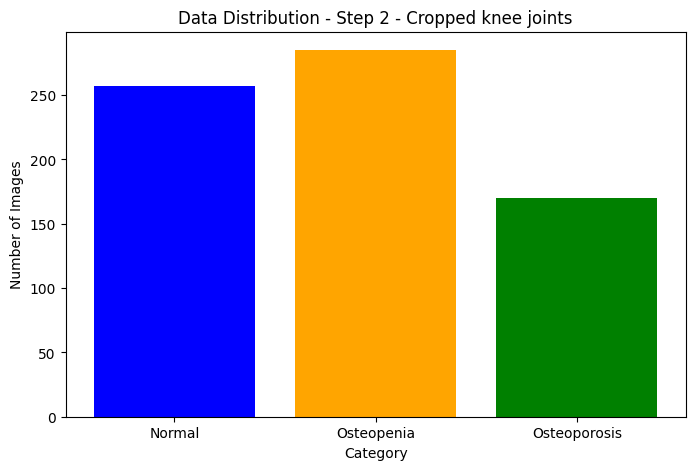

In [7]:
dataset_statistics(output_path_step2, "Step 2 - Cropped knee joints")

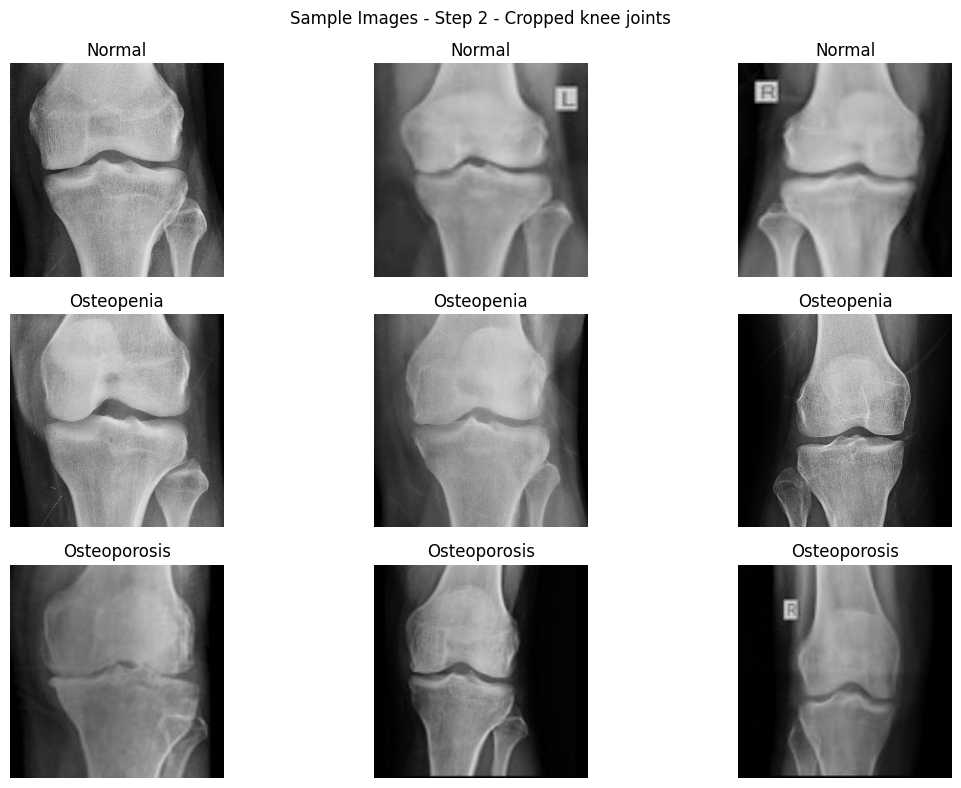

In [14]:
show_sample_images(output_path_step2, "Step 2 - Cropped knee joints")

### Step 3 - Split the dataset into train and validation

In [16]:
import os
import shutil
import random

# Paths
cropped_data_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_square_adaptive_knee"
output_train_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_3_split_train"
output_val_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_3_split_val"

# Create output directories
categories = ["Normal", "Osteopenia", "Osteoporosis"]
for category in categories:
    os.makedirs(os.path.join(output_train_path, category), exist_ok=True)
    os.makedirs(os.path.join(output_val_path, category), exist_ok=True)

# Split ratio
train_ratio = 0.8  # 80% training, 20% validation

def split_data(input_path, train_path, val_path, train_ratio=0.8):
    """Splits images into training and validation sets while preserving class balance."""
    for category in categories:
        category_path = os.path.join(input_path, category)
        images = [img for img in os.listdir(category_path) if img.lower().endswith((".png", ".jpg", ".jpeg"))]
        
        # Shuffle and split data
        random.shuffle(images)
        split_idx = int(len(images) * train_ratio)
        train_images, val_images = images[:split_idx], images[split_idx:]

        # Move images to respective folders
        for img in train_images:
            shutil.copy(os.path.join(category_path, img), os.path.join(train_path, category, img))
        
        for img in val_images:
            shutil.copy(os.path.join(category_path, img), os.path.join(val_path, category, img))

        print(f"📂 {category}: {len(train_images)} training, {len(val_images)} validation images.")

# Run data splitting
split_data(cropped_data_path, output_train_path, output_val_path)

print("\n✅ Step 3 Complete: Data successfully split into training and validation sets.")

📂 Normal: 205 training, 52 validation images.
📂 Osteopenia: 228 training, 57 validation images.
📂 Osteoporosis: 136 training, 34 validation images.

✅ Step 3 Complete: Data successfully split into training and validation sets.


### Step 4 - Knee joint Augmentation on trainind dataset only

Applies 5 different augmentations, each labeled with its type:

1.	Rotation (±15°)
2.	Horizontal Flip
3.	Brightness & Contrast Adjustment
4.	Affine Transformations (Shift & Scale)
5.	Gaussian Blur

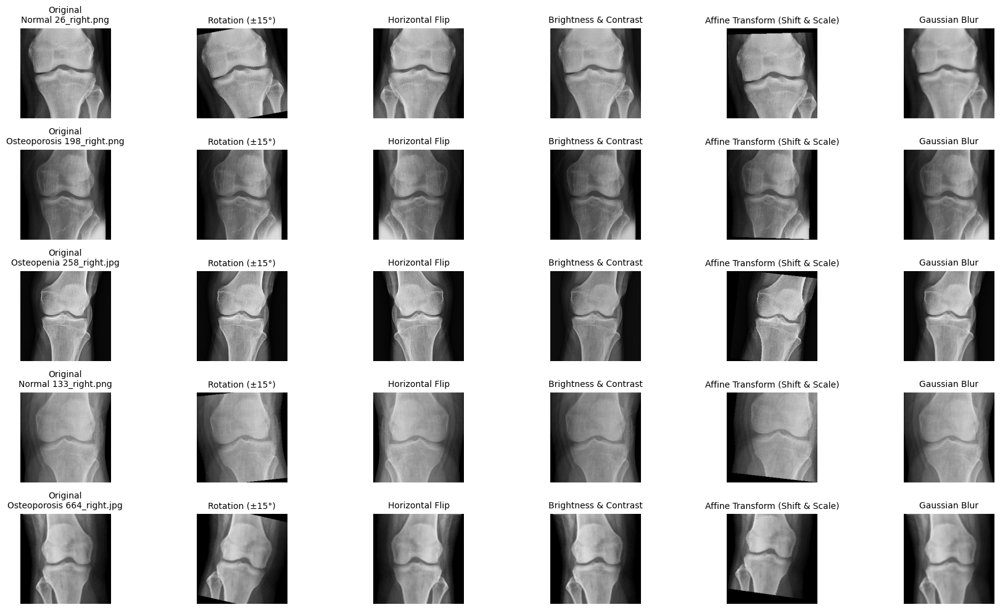

In [17]:
import random
import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image

# Path to Step 2 dataset
step2_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_square_adaptive_knee"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Define augmentation transforms with labels
augmentation_transforms = [
    ("Rotation (±15°)", transforms.RandomRotation(degrees=15)),
    ("Horizontal Flip", transforms.RandomHorizontalFlip(p=1.0)),
    ("Brightness & Contrast", transforms.ColorJitter(brightness=0.2, contrast=0.2)),
    ("Affine Transform (Shift & Scale)", transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1))),
    ("Gaussian Blur", transforms.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 2.0)))
]

# Select 5 random images
selected_images = []
for category in categories:
    category_path = os.path.join(step2_path, category)
    image_paths = glob.glob(os.path.join(category_path, "*.jpg")) + glob.glob(os.path.join(category_path, "*.png"))
    selected_images.extend(random.sample(image_paths, min(2, len(image_paths))))  # Select up to 2 per category

selected_images = random.sample(selected_images, min(5, len(selected_images)))  # Take only 5 total

# Apply augmentations and display
fig, axes = plt.subplots(len(selected_images), 6, figsize=(18, 10))

for i, img_path in enumerate(selected_images):
    img = Image.open(img_path).convert("RGB")
    
    # Show original image
    axes[i, 0].imshow(img, cmap="gray")
    axes[i, 0].set_title(f"Original\n{os.path.basename(img_path)}", fontsize=10)
    axes[i, 0].axis("off")

    # Apply augmentations
    for j, (aug_name, transform) in enumerate(augmentation_transforms):
        augmented_img = transform(img)
        axes[i, j + 1].imshow(augmented_img, cmap="gray")
        axes[i, j + 1].set_title(f"{aug_name}", fontsize=10)  # Show augmentation type
        axes[i, j + 1].axis("off")

plt.tight_layout()
plt.show()

#### Data Augmentation

In [18]:
import os
import random
import glob
from PIL import Image
import torchvision.transforms as transforms
from tqdm import tqdm

# Paths
input_path_step3 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_3_split_train"
output_path_step4 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_4_train_augmented"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Define augmentation transforms
augmentation_transforms = [
    ("rotation", transforms.RandomRotation(degrees=15)),
    ("flip", transforms.RandomHorizontalFlip(p=1.0)),
    ("brightness_contrast", transforms.ColorJitter(brightness=0.2, contrast=0.2)),
    ("affine", transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1))),
    ("gaussian_blur", transforms.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 2.0)))
]

# Create output directory structure
for category in categories:
    os.makedirs(os.path.join(output_path_step4, category), exist_ok=True)

# Process images
for category in categories:
    category_path = os.path.join(input_path_step3, category)
    output_category_path = os.path.join(output_path_step4, category)
    
    image_paths = glob.glob(os.path.join(category_path, "*.jpg")) + glob.glob(os.path.join(category_path, "*.png"))
    
    for img_path in tqdm(image_paths, desc=f"Augmenting {category}"):
        img = Image.open(img_path).convert("RGB")  # Ensure RGB mode
        
        # Save the original image as well
        img.save(os.path.join(output_category_path, os.path.basename(img_path)))
        
        # Apply each augmentation
        for aug_name, transform in augmentation_transforms:
            augmented_img = transform(img)
            new_filename = f"{os.path.splitext(os.path.basename(img_path))[0]}_{aug_name}.jpg"
            augmented_img.save(os.path.join(output_category_path, new_filename))

print("\n✅ Step 3 Complete: Augmented images saved.")

Augmenting Osteoporosis: 100%|██████████| 168/168 [00:01<00:00, 121.17it/s]


✅ Step 3 Complete: Augmented images saved.



📊 **Dataset Statistics After Step 4 - Augmented train knee joints:**
  📂 Normal: 1224 images
  📂 Osteopenia: 1392 images
  📂 Osteoporosis: 816 images


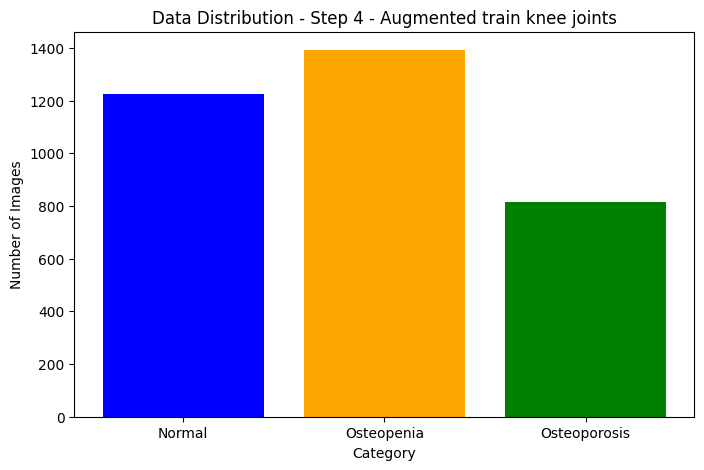

: 

In [ ]:
dataset_statistics(output_path_step4, "Step 4 - Augmented train knee joints")

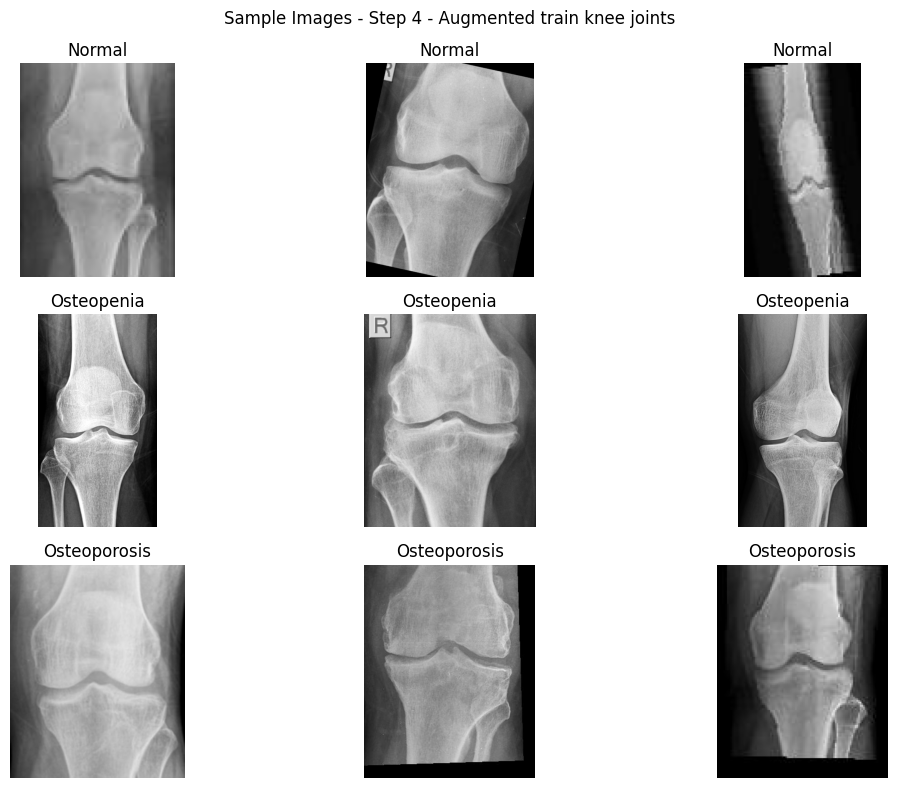

: 

In [ ]:
show_sample_images(output_path_step4, "Step 4 - Augmented train knee joints")

### Step 5 - Enhence Xray images

#### Applies four enhancement techniques:

1. CLAHE (Contrast Enhancement): Enhances bone visibility in low-contrast X-rays.
2. Unsharp Masking (Sharpening): Enhances edges and details in the X-ray.
3. Edge Detection (Canny): Highlights bone structures.
4. Pseudo-Color Mapping: Uses a color map to highlight different intensity areas.


Processing 2 images from category: Normal


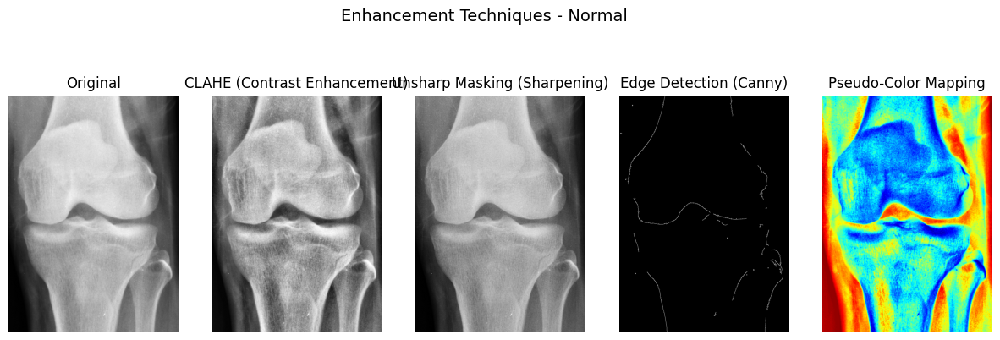

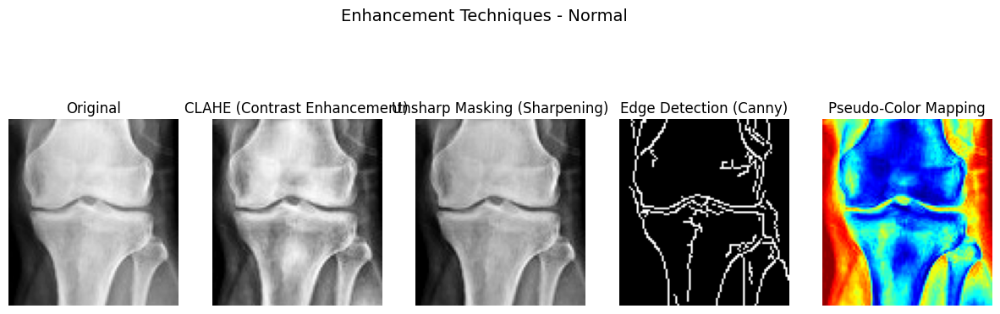


Processing 2 images from category: Osteopenia


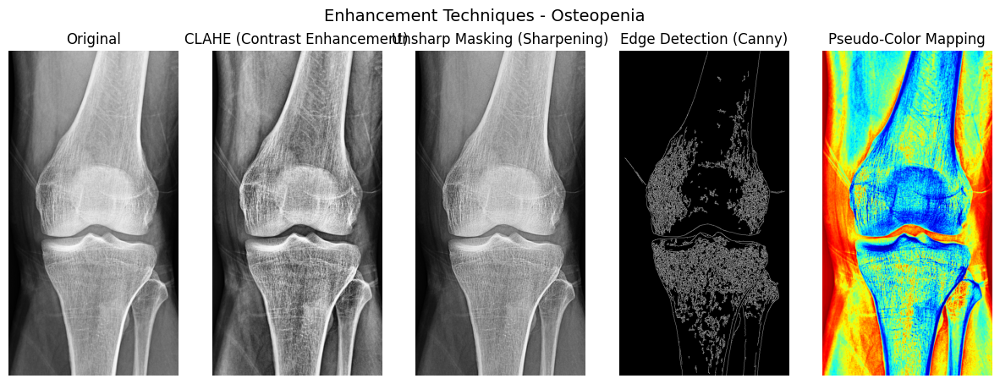

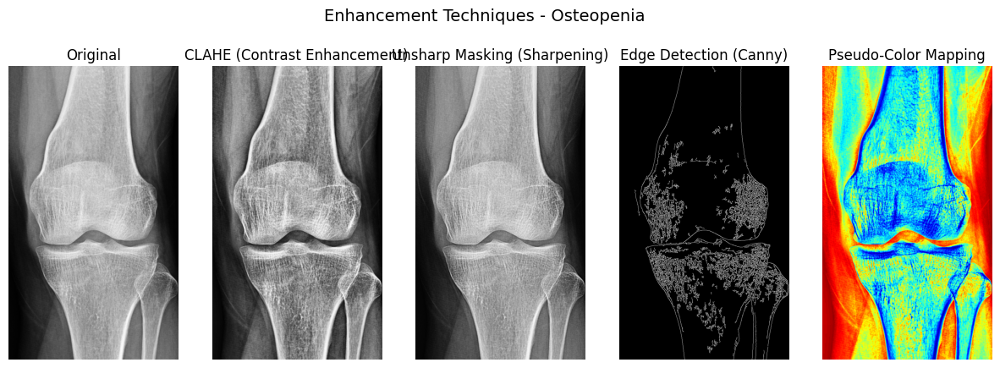


Processing 2 images from category: Osteoporosis


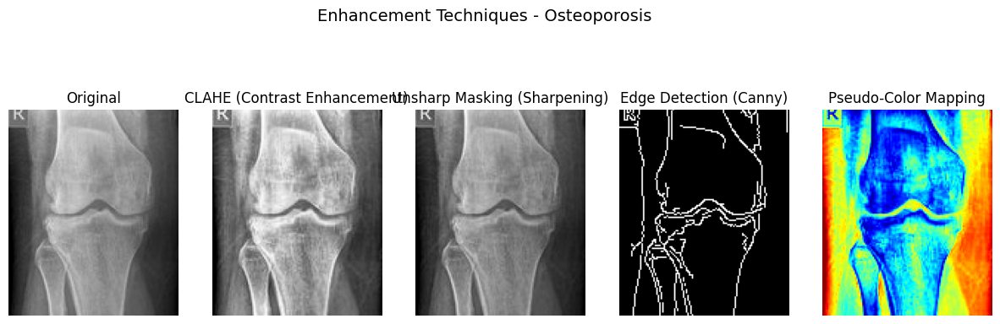

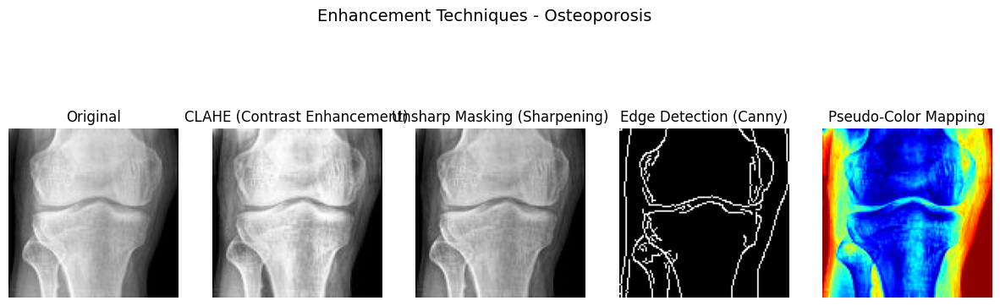

: 

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define the folder path for Step 2 Cropped Data
base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"

# Categories to process
categories = ["Normal", "Osteopenia", "Osteoporosis"]

### Enhancement Functions ###
def apply_clahe(image):
    """Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)"""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

def apply_unsharp_mask(image):
    """Apply Unsharp Masking for sharpening"""
    blurred = cv2.GaussianBlur(image, (9, 9), 10.0)
    sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)
    return sharpened

def apply_edge_detection(image):
    """Apply Canny Edge Detection"""
    return cv2.Canny(image, 50, 150)

def apply_pseudo_color(image):
    """Apply Pseudo-Color Mapping"""
    return cv2.applyColorMap(cv2.convertScaleAbs(image), cv2.COLORMAP_JET)

### Process and Visualize Enhancement Techniques ###
def process_multiple_images(base_path, categories, num_images=1):
    for category in categories:
        category_path = os.path.join(base_path, category)

        # Ensure the folder exists and contains images
        if not os.path.exists(category_path) or not os.listdir(category_path):
            print(f"No images found in {category_path}. Skipping...")
            continue

        # Get all image files in the category
        image_files = [
            os.path.join(category_path, f)
            for f in os.listdir(category_path)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ]

        # Randomly select images to process
        selected_images = random.sample(image_files, min(num_images, len(image_files)))

        print(f"\nProcessing {len(selected_images)} images from category: {category}")

        # Process each selected image
        for image_path in selected_images:
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                print(f"Error loading image: {image_path}")
                continue
            
            # Apply transformations
            clahe_img = apply_clahe(img)
            sharpened_img = apply_unsharp_mask(img)
            edges_img = apply_edge_detection(img)
            pseudo_color_img = apply_pseudo_color(clahe_img)

            # Plot results
            fig, axes = plt.subplots(1, 5, figsize=(15, 5))
            fig.suptitle(f"Enhancement Techniques - {category}", fontsize=14)

            axes[0].imshow(img, cmap="gray")
            axes[0].set_title("Original")
            axes[0].axis("off")

            axes[1].imshow(clahe_img, cmap="gray")
            axes[1].set_title("CLAHE (Contrast Enhancement)")
            axes[1].axis("off")

            axes[2].imshow(sharpened_img, cmap="gray")
            axes[2].set_title("Unsharp Masking (Sharpening)")
            axes[2].axis("off")

            axes[3].imshow(edges_img, cmap="gray")
            axes[3].set_title("Edge Detection (Canny)")
            axes[3].axis("off")

            axes[4].imshow(pseudo_color_img)
            axes[4].set_title("Pseudo-Color Mapping")
            axes[4].axis("off")

            plt.show()

# Run the function
process_multiple_images(base_path, categories, num_images=2)

#### Introducing a problem

variation in image quality (resolution, sharpness, contrast, and noise levels) can lead to misleading classification results. If normal X-rays are of high quality and osteoporosis X-rays are blurry or low-resolution, the model might misinterpret sharp details in normal images as abnormalities, and miss osteoporosis signs in poor-quality images.

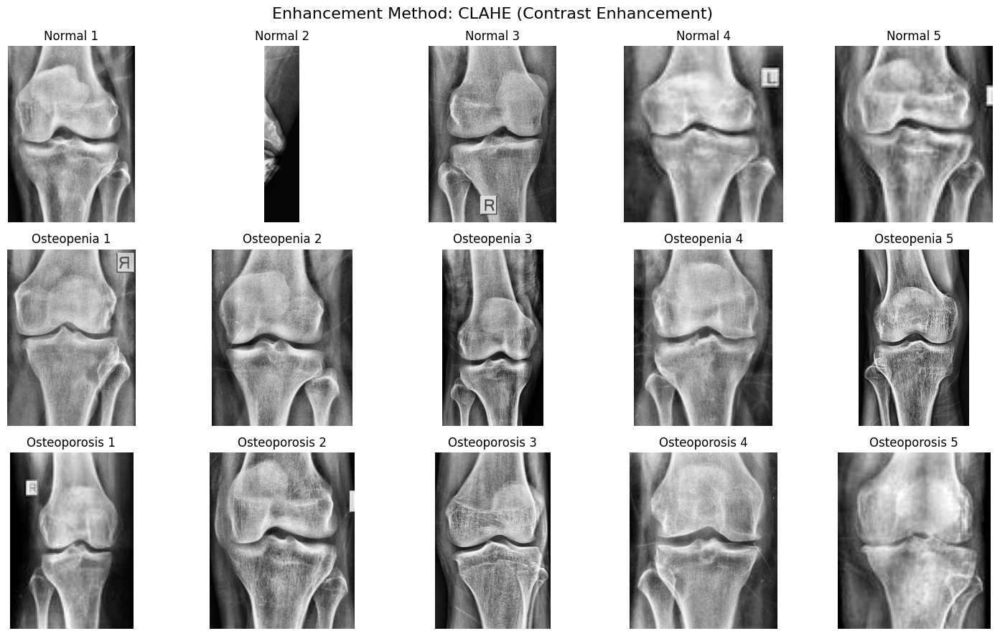

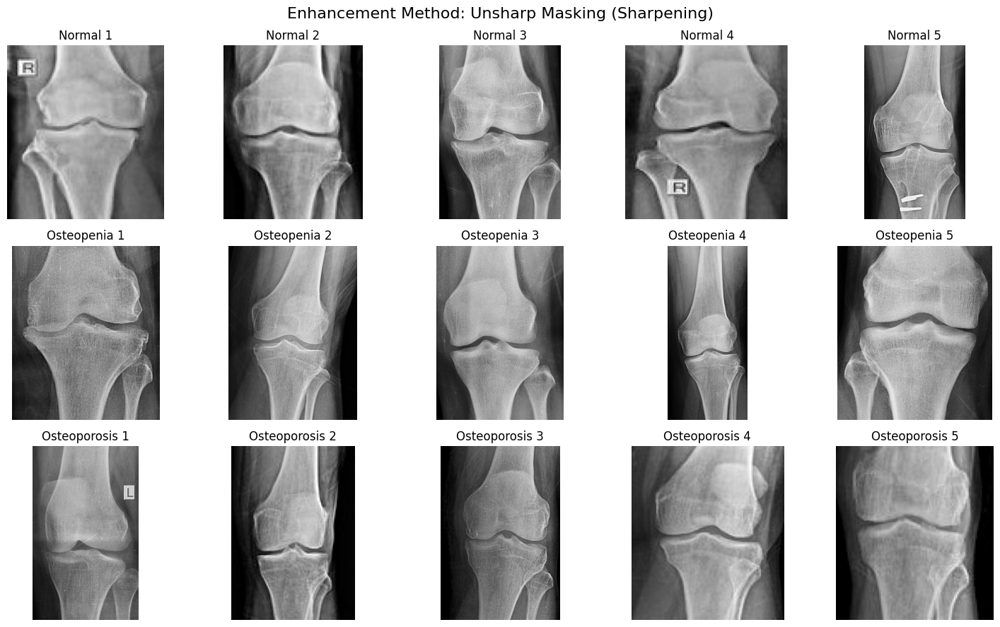

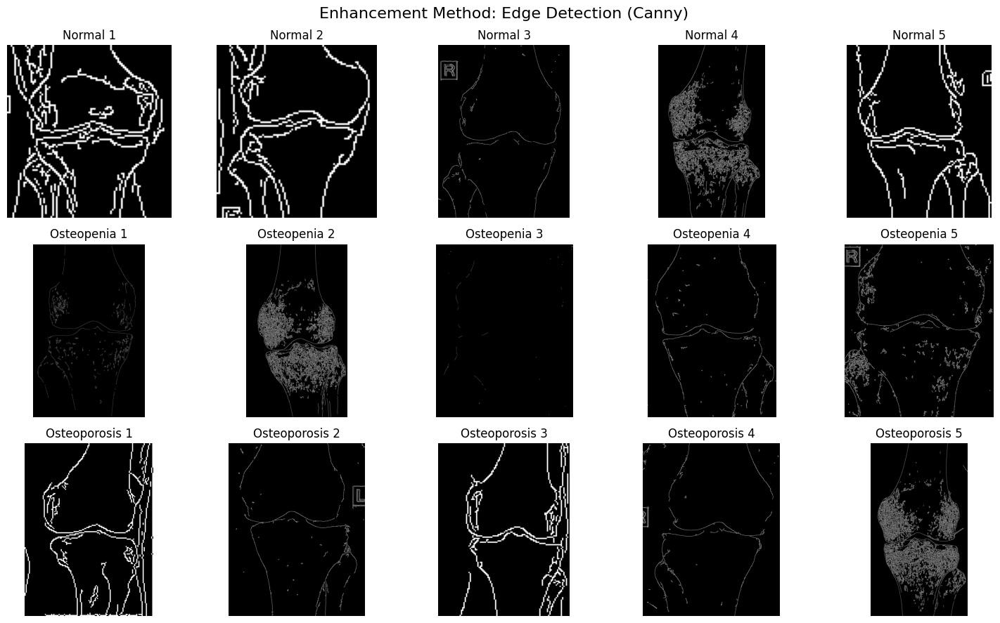

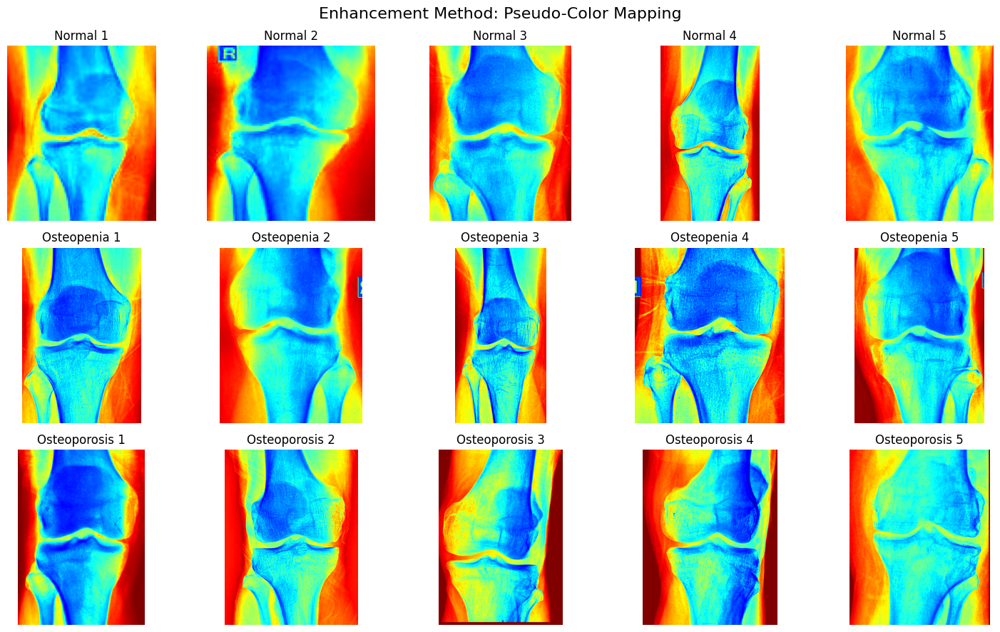

In [19]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define the folder path for Step 2 Cropped Data
base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"

# Categories to process
categories = ["Normal", "Osteopenia", "Osteoporosis"]

### Enhancement Functions ###
def apply_clahe(image):
    """Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)"""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

def apply_unsharp_mask(image):
    """Apply Unsharp Masking for sharpening"""
    blurred = cv2.GaussianBlur(image, (9, 9), 10.0)
    sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)
    return sharpened

def apply_edge_detection(image):
    """Apply Canny Edge Detection"""
    return cv2.Canny(image, 50, 150)

def apply_pseudo_color(image):
    """Apply Pseudo-Color Mapping"""
    return cv2.applyColorMap(cv2.convertScaleAbs(image), cv2.COLORMAP_JET)

### Process and Visualize Enhancement Techniques by Filter ###
def process_images_by_filter(base_path, categories, num_images=5):
    # Enhancement methods and their functions
    enhancement_methods = {
        "CLAHE (Contrast Enhancement)": apply_clahe,
        "Unsharp Masking (Sharpening)": apply_unsharp_mask,
        "Edge Detection (Canny)": apply_edge_detection,
        "Pseudo-Color Mapping": apply_pseudo_color,
    }

    # Iterate over each enhancement method
    for method_name, method_function in enhancement_methods.items():
        fig, axes = plt.subplots(len(categories), num_images, figsize=(15, 9))
        fig.suptitle(f"Enhancement Method: {method_name}", fontsize=16)

        for row_idx, category in enumerate(categories):
            category_path = os.path.join(base_path, category)

            # Ensure the folder exists and contains images
            if not os.path.exists(category_path) or not os.listdir(category_path):
                print(f"No images found in {category_path}. Skipping...")
                continue

            # Get all image files in the category
            image_files = [
                os.path.join(category_path, f)
                for f in os.listdir(category_path)
                if f.lower().endswith((".png", ".jpg", ".jpeg"))
            ]

            # Randomly select images to process
            selected_images = random.sample(image_files, min(num_images, len(image_files)))

            # Process each selected image
            for col_idx, image_path in enumerate(selected_images):
                img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                if img is None:
                    print(f"Error loading image: {image_path}")
                    continue
                
                # Apply enhancement method
                enhanced_img = method_function(img)

                # Plot result
                axes[row_idx, col_idx].imshow(enhanced_img, cmap="gray" if method_name != "Pseudo-Color Mapping" else None)
                axes[row_idx, col_idx].set_title(f"{category} {col_idx+1}")
                axes[row_idx, col_idx].axis("off")

        plt.tight_layout()
        plt.show()

# Run the function
process_images_by_filter(base_path, categories, num_images=5)

#### Apply CLAHE and Save to the New Folder Structure

In [21]:
import os
import cv2
import shutil
import numpy as np
from tqdm import tqdm

# Define paths
input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_4_train_augmented"
output_base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_5_enhanced_train_xrays"
output_clahe_path = os.path.join(output_base_path, "CLAHE")

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Ensure directory structure
for category in categories:
    os.makedirs(os.path.join(output_clahe_path, category), exist_ok=True)

# Apply CLAHE function
def apply_clahe(image):
    """Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)"""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

# Process images
def enhance_images_with_clahe(input_path, output_path):
    """Applies CLAHE enhancement to all images in the dataset"""
    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        # Process each image
        for img_name in tqdm(os.listdir(category_path), desc=f"Applying CLAHE to {category}"):
            img_path = os.path.join(category_path, img_name)

            try:
                # Read and process image
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                if img is None:
                    print(f"Error loading {img_path}")
                    continue

                # Apply CLAHE
                enhanced_img = apply_clahe(img)

                # Save to new folder
                output_file_path = os.path.join(output_category_path, img_name)
                cv2.imwrite(output_file_path, enhanced_img)
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

    print(f"\n✅ CLAHE enhancement completed! Images saved in: {output_path}")

# Run the CLAHE enhancement process
enhance_images_with_clahe(input_path, output_clahe_path)

Applying CLAHE to Osteoporosis: 100%|██████████| 1008/1008 [00:00<00:00, 1201.33it/s]


✅ CLAHE enhancement completed! Images saved in: /Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_5_enhanced_train_xrays/CLAHE


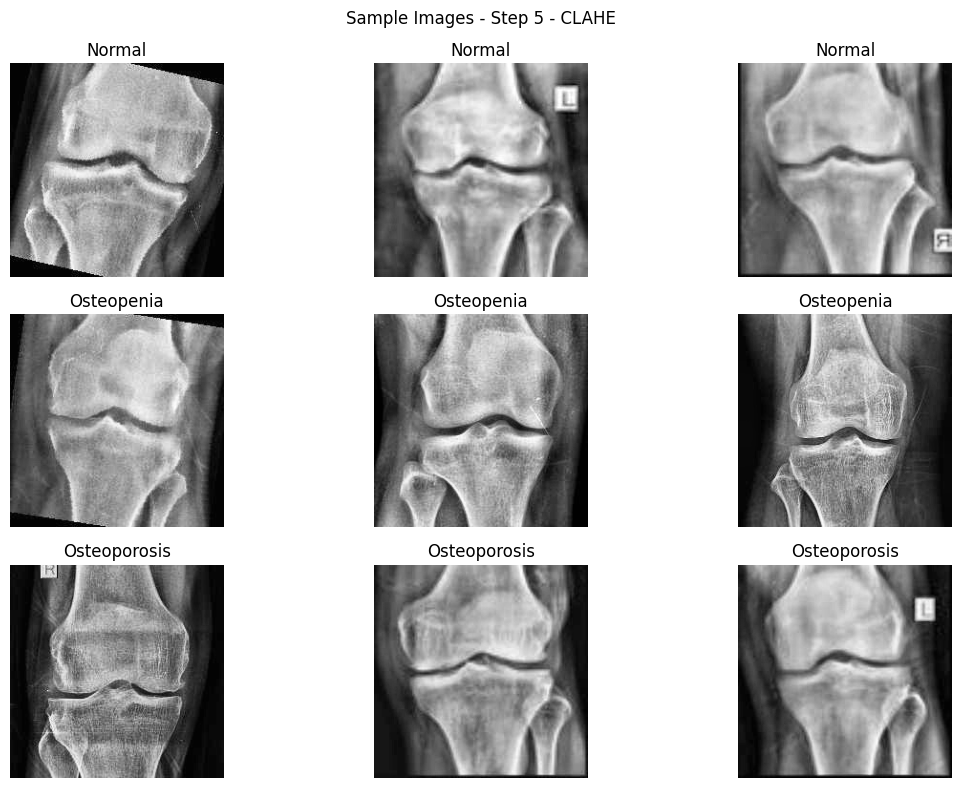


📊 **Dataset Statistics After Step 5 - CLAHE:**
  📂 Normal: 1530 images
  📂 Osteopenia: 1722 images
  📂 Osteoporosis: 1008 images


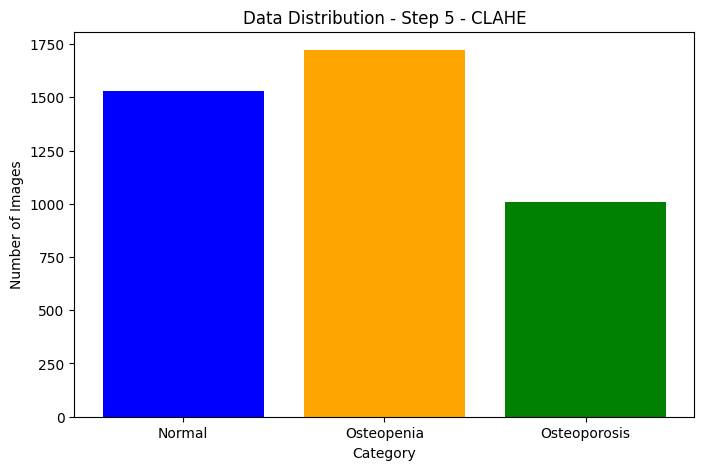

In [22]:
show_sample_images(output_clahe_path, "Step 5 - CLAHE")
dataset_statistics(output_clahe_path, "Step 5 - CLAHE")

# Before applying any filter we need to think what to do with the  different resolution

### Second dataset -  Test Dataset Distribution Before Preprocessing

In [ ]:
# Paths
test_input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/ROOT_DATASETS/Osteoporosis Knee X-ray"
test_output_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/test_metabolic_dataset"

# Ensure output directory exists
os.makedirs(output_path, exist_ok=True)


📊 **Dataset Statistics After Test dataset:**
  📂 Normal: 36 images
  📂 Osteopenia: 154 images
  📂 Osteoporosis: 49 images


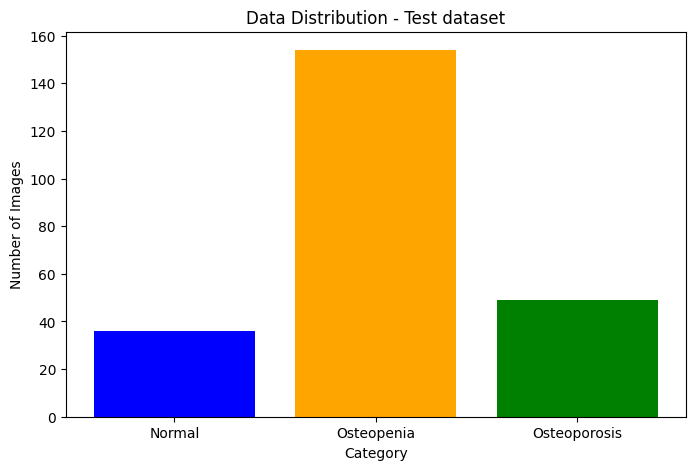

In [ ]:
dataset_statistics(test_input_path, "Test dataset")

Category-wise Statistics:
Category: Normal
  Duplicates: 3
  Unique Images: 33
Category: Osteopenia
  Duplicates: 13
  Unique Images: 141
Category: Osteoporosis
  Duplicates: 6
  Unique Images: 43

Duplicate Distribution:
  20 images have 1 duplicates.
  1 images have 2 duplicates.


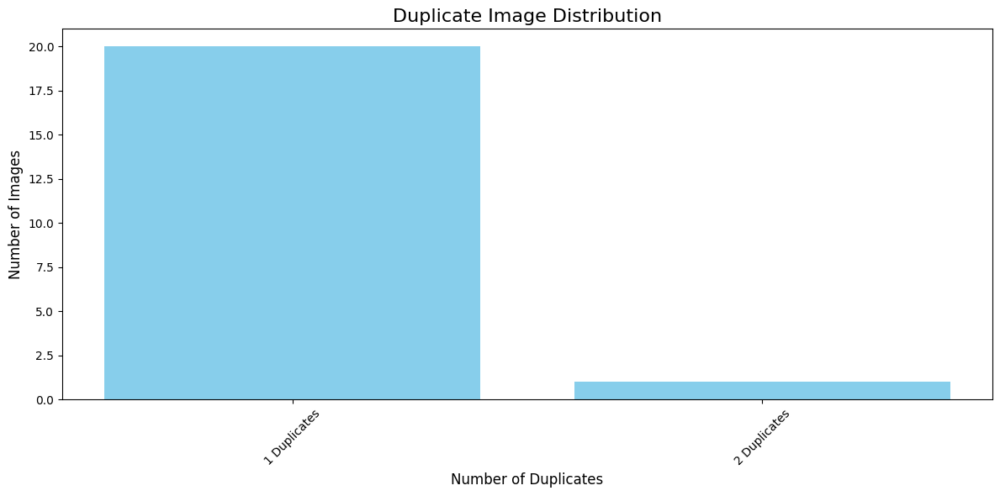


Displaying first 5 duplicate pairs:


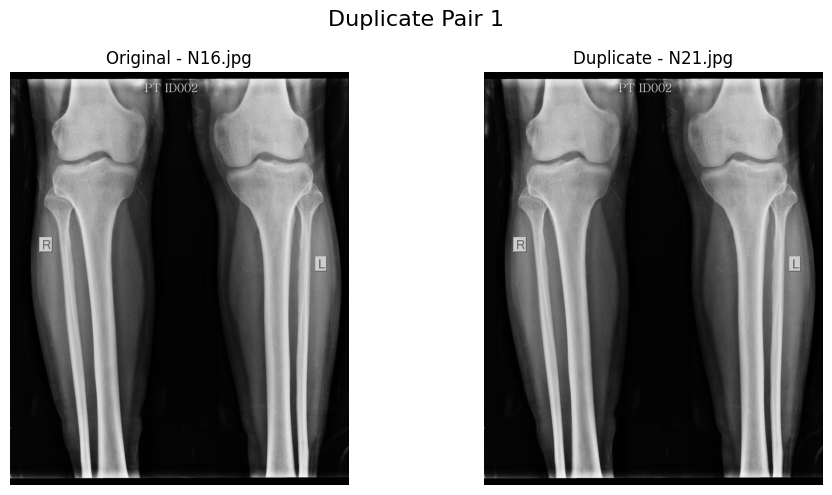

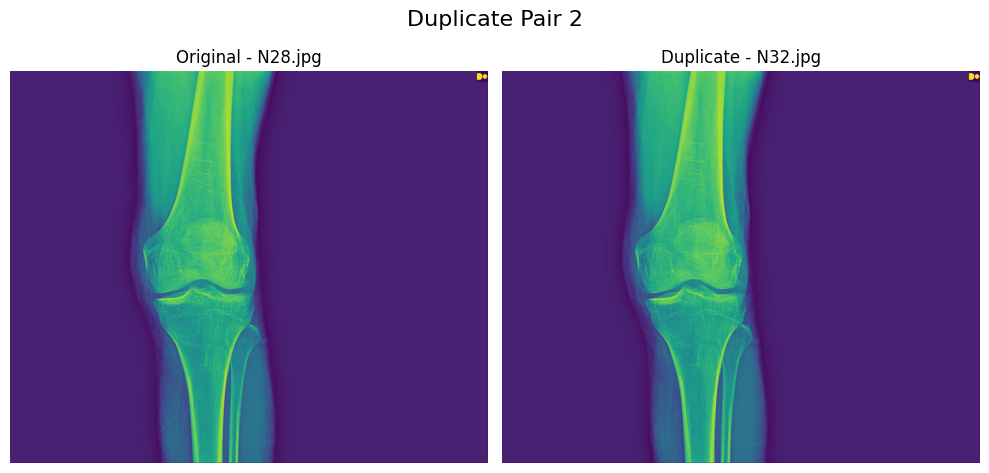

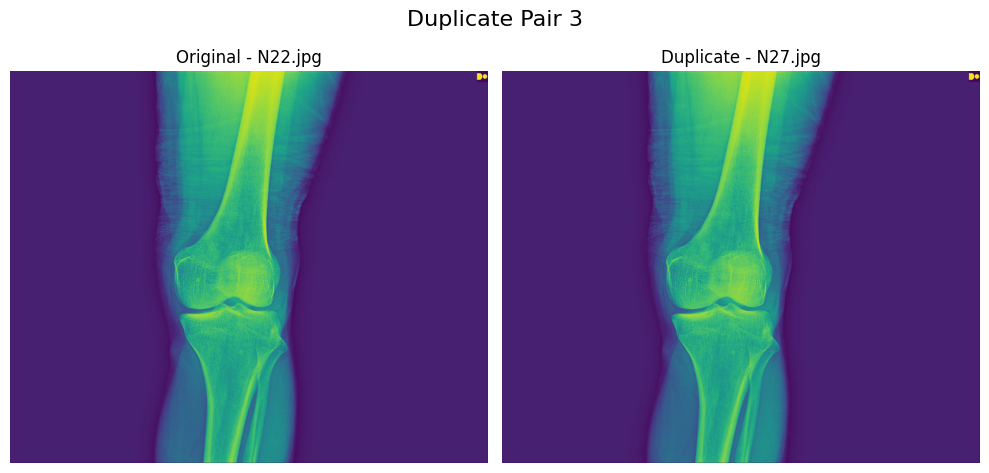

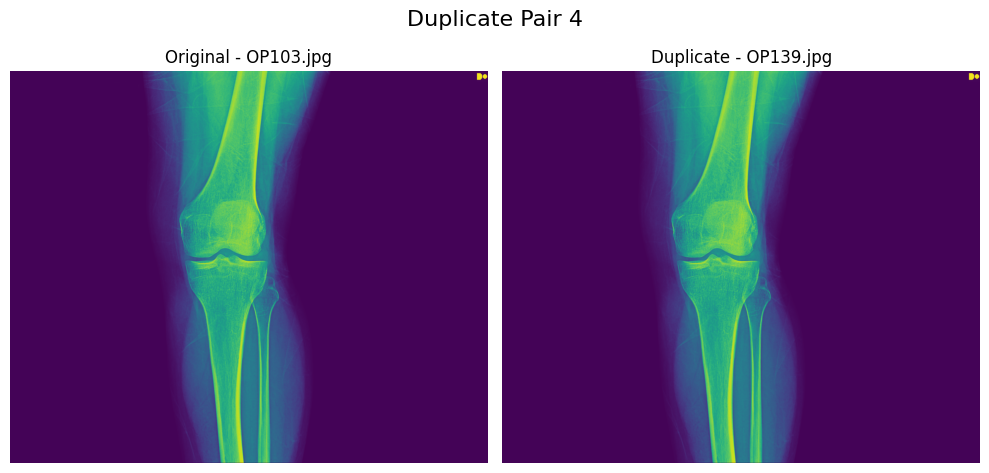

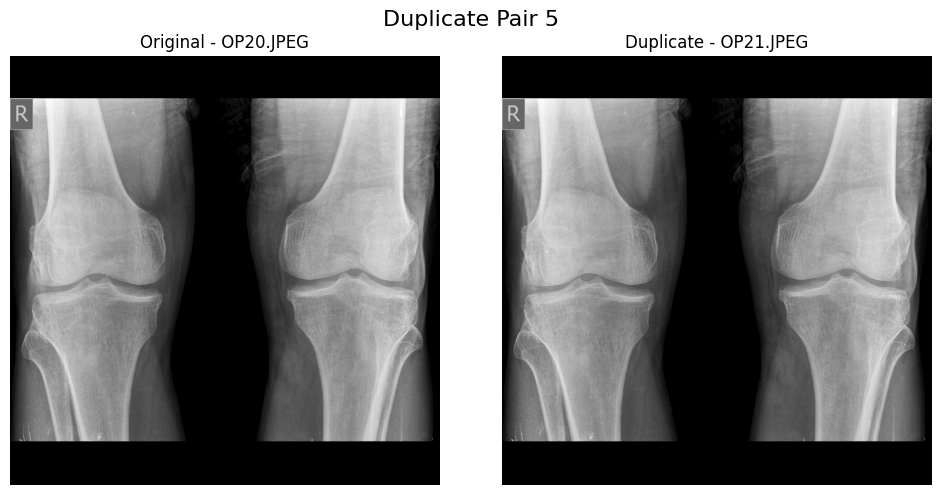

In [ ]:
import imagehash
from PIL import Image
import os
import matplotlib.pyplot as plt
from collections import defaultdict

# Base path to dataset
base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/ROOT_DATASETS/Osteoporosis Knee X-ray"

# Categories to process
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Compute hashes and find duplicates
hashes = {}
duplicates = defaultdict(list)  # Dictionary to store duplicates by their original hash
category_stats = {cls: {"duplicates": 0, "unique": 0} for cls in categories}

for cls in categories:
    folder_path = os.path.join(base_path, cls)
    for img_name in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_name)
        try:
            img = Image.open(img_path)
            img_hash = imagehash.phash(img)  # Compute perceptual hash
            if img_hash in hashes:
                duplicates[img_hash].append(img_path)  # Group duplicates by hash
                category_stats[cls]["duplicates"] += 1
            else:
                hashes[img_hash] = img_path
                category_stats[cls]["unique"] += 1
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

# Output the statistics for each category
print("Category-wise Statistics:")
for cls, stats in category_stats.items():
    print(f"Category: {cls}")
    print(f"  Duplicates: {stats['duplicates']}")
    print(f"  Unique Images: {stats['unique']}")

# Analyze duplicate counts for detailed distribution (1, 2, 3, ... duplicates)
duplicate_distribution = defaultdict(int)
for original_img, duplicate_imgs in duplicates.items():
    duplicate_distribution[len(duplicate_imgs)] += 1

# Print duplicate distribution
print("\nDuplicate Distribution:")
for num_duplicates, num_images in sorted(duplicate_distribution.items()):
    print(f"  {num_images} images have {num_duplicates} duplicates.")

# Visualize the distribution as a bar chart
plt.figure(figsize=(12, 6))
plt.bar(
    [f"{k} Duplicates" for k in sorted(duplicate_distribution.keys())],
    [duplicate_distribution[k] for k in sorted(duplicate_distribution.keys())],
    color="skyblue",
)
plt.title("Duplicate Image Distribution", fontsize=16)
plt.ylabel("Number of Images", fontsize=12)
plt.xlabel("Number of Duplicates", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Display the first 5 duplicate pairs
def display_duplicates(duplicate_pairs, max_pairs=5):
    pairs_shown = 0
    for img_hash, dup_list in duplicate_pairs.items():
        if pairs_shown >= max_pairs:
            break
        original_img = hashes[img_hash]
        for duplicate_img in dup_list[:max_pairs]:
            try:
                img1 = Image.open(original_img)
                img2 = Image.open(duplicate_img)
                
                fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                axes[0].imshow(img1)
                axes[0].set_title(f"Original - {os.path.basename(original_img)}")
                axes[0].axis("off")

                axes[1].imshow(img2)
                axes[1].set_title(f"Duplicate - {os.path.basename(duplicate_img)}")
                axes[1].axis("off")

                plt.suptitle(f"Duplicate Pair {pairs_shown + 1}", fontsize=16)
                plt.tight_layout()
                plt.show()
                
                pairs_shown += 1
                if pairs_shown >= max_pairs:
                    break
            except Exception as e:
                print(f"Error displaying duplicate pair: {e}")

# Display first 5 duplicate pairs
print("\nDisplaying first 5 duplicate pairs:")
display_duplicates(duplicates, max_pairs=5)

In [ ]:
analyze_and_remove_duplicates(test_input_path, test_output_path)

Processing Osteoporosis: 100%|██████████████████| 49/49 [00:00<00:00, 64.13it/s]


✅ Step 1 Complete: 22 duplicate images removed.


### cropping the knees of the metabolic data

In [3]:
import glob
import cv2
import os
from tqdm import tqdm
from ultralytics import YOLO

# --- Paths ---
model_path = "/Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo/yolo_run/weights/best.onnx"
input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/test_metabolic_dataset_uncropped"
output_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/test_cropped_data"

# --- Setup ---
model = YOLO(model_path)
os.makedirs(output_path, exist_ok=True)

def adaptive_centered_square_crop(image, x1, y1, x2, y2, output_size=224):
    h, w, _ = image.shape
    x_center = (x1 + x2) // 2
    y_center = (y1 + y2) // 2

    box_w = x2 - x1
    box_h = y2 - y1
    crop_size = int((box_w + box_h) / 2)
    half_crop = crop_size // 2

    x1_crop = max(0, x_center - half_crop)
    y1_crop = max(0, y_center - half_crop)
    x2_crop = min(w, x_center + half_crop)
    y2_crop = min(h, y_center + half_crop)

    cropped = image[y1_crop:y2_crop, x1_crop:x2_crop]

    pad_top = (crop_size - cropped.shape[0]) // 2
    pad_bottom = (crop_size - cropped.shape[0] + 1) // 2
    pad_left = (crop_size - cropped.shape[1]) // 2
    pad_right = (crop_size - cropped.shape[1] + 1) // 2

    padded = cv2.copyMakeBorder(
        cropped,
        pad_top,
        pad_bottom,
        pad_left,
        pad_right,
        borderType=cv2.BORDER_CONSTANT,
        value=[0, 0, 0],
    )

    resized = cv2.resize(padded, (output_size, output_size))
    return resized

def crop_and_save_knees(input_path, output_path):
    image_extensions = ["jpg", "jpeg", "png", "bmp", "tiff", "JPEG"]
    image_paths = []
    for ext in image_extensions:
        image_paths.extend(glob.glob(os.path.join(input_path, f"*.{ext}")))

    print(f"📂 Found {len(image_paths)} images in {input_path}")

    for img_path in tqdm(image_paths, desc="Cropping knees"):
        image = cv2.imread(img_path)
        if image is None:
            print(f"⚠️ Skipping unreadable image: {img_path}")
            continue

        results = model(image)
        cropped_knees = []
        width_threshold = image.shape[1] // 2

        for result in results:
            for box in result.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                confidence = box.conf[0].item()

                cropped = adaptive_centered_square_crop(image, x1, y1, x2, y2)

                if cropped.size != 0:
                    cropped_knees.append((cropped, confidence, x1, x2))

        left_knee, right_knee = None, None
        left_conf, right_conf = 0, 0

        for knee, conf, x1, x2 in cropped_knees:
            if x2 < width_threshold:
                if conf > left_conf:
                    left_knee, left_conf = knee, conf
            else:
                if conf > right_conf:
                    right_knee, right_conf = knee, conf

        base_filename = os.path.basename(img_path)
        filename_no_ext, ext = os.path.splitext(base_filename)

        if left_knee is not None:
            left_output_path = os.path.join(output_path, f"{filename_no_ext}_left{ext}")
            cv2.imwrite(left_output_path, left_knee)

        if right_knee is not None:
            right_output_path = os.path.join(output_path, f"{filename_no_ext}_right{ext}")
            cv2.imwrite(right_output_path, right_knee)

        if left_knee is not None and right_knee is not None:
            both_output_path = os.path.join(output_path, f"{filename_no_ext}_both{ext}")
            # Concatenate side-by-side
            both_combined = cv2.hconcat([left_knee, right_knee])
            cv2.imwrite(both_output_path, both_combined)

    print("\n✅ Cropping Complete. All knees saved to:", output_path)

# Run
crop_and_save_knees(input_path, output_path)

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
📂 Found 0 images in /Users/gideonbonwitt/Documents/Msc/Final Project/datasets/test_metabolic_dataset_uncropped


Cropping knees: 0it [00:00, ?it/s]


✅ Cropping Complete. All knees saved to: /Users/gideonbonwitt/Documents/Msc/Final Project/datasets/test_cropped_data


In [4]:
import glob
import cv2
import os
from tqdm import tqdm
from ultralytics import YOLO

# Load YOLO model
model_path = "/Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo/yolo_run/weights/best.onnx"
model = YOLO(model_path)

# Paths
input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/test_metabolic_dataset_uncropped"
output_path_step2 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/test_cropped_data"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Ensure output directories exist
for category in categories:
    os.makedirs(os.path.join(output_path_step2, category), exist_ok=True)

def adaptive_centered_square_crop(image, x1, y1, x2, y2, output_size=224):
    """Crop a square around the center of the YOLO box using avg(width, height), then resize to output_size."""
    h, w, _ = image.shape
    x_center = (x1 + x2) // 2
    y_center = (y1 + y2) // 2

    box_w = x2 - x1
    box_h = y2 - y1
    crop_size = int((box_w + box_h) / 2)
    half_crop = crop_size // 2

    x1_crop = max(0, x_center - half_crop)
    y1_crop = max(0, y_center - half_crop)
    x2_crop = min(w, x_center + half_crop)
    y2_crop = min(h, y_center + half_crop)

    cropped = image[y1_crop:y2_crop, x1_crop:x2_crop]

    # Pad if smaller than crop_size (due to borders)
    pad_top = (crop_size - cropped.shape[0]) // 2
    pad_bottom = (crop_size - cropped.shape[0] + 1) // 2
    pad_left = (crop_size - cropped.shape[1]) // 2
    pad_right = (crop_size - cropped.shape[1] + 1) // 2

    padded = cv2.copyMakeBorder(
        cropped,
        pad_top,
        pad_bottom,
        pad_left,
        pad_right,
        borderType=cv2.BORDER_CONSTANT,
        value=[0, 0, 0],
    )

    # Resize to model input size
    resized = cv2.resize(padded, (output_size, output_size))
    return resized

def crop_and_save_knees(input_path, output_path):
    """Uses YOLO to detect and save square knee crops using avg(w,h) with resize to 224x224."""
    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        # Get all images
        image_extensions = ["jpg", "jpeg", "png", "bmp", "tiff"]
        image_paths = []
        for ext in image_extensions:
            image_paths.extend(glob.glob(os.path.join(category_path, f"*.{ext}")))

        print(f"📂 Processing {category} - {len(image_paths)} images")

        for img_path in tqdm(image_paths, desc=f"Cropping {category}"):
            image = cv2.imread(img_path)
            if image is None:
                print(f"⚠️ Skipping unreadable image: {img_path}")
                continue

            results = model(image)
            cropped_knees = []
            width_threshold = image.shape[1] // 2

            for result in results:
                for box in result.boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    confidence = box.conf[0].item()

                    cropped = adaptive_centered_square_crop(image, x1, y1, x2, y2)

                    if cropped.size != 0:
                        cropped_knees.append((cropped, confidence, x1, x2))

            # Separate left and right knees
            left_knee, right_knee = None, None
            left_conf, right_conf = 0, 0

            for knee, conf, x1, x2 in cropped_knees:
                if x2 < width_threshold:
                    if conf > left_conf:
                        left_knee, left_conf = knee, conf
                else:
                    if conf > right_conf:
                        right_knee, right_conf = knee, conf

            # Save cropped knees
            base_filename = os.path.basename(img_path)
            filename_no_ext, ext = os.path.splitext(base_filename)

            if left_knee is not None:
                left_output_path = os.path.join(output_category_path, f"{filename_no_ext}_left{ext}")
                cv2.imwrite(left_output_path, left_knee)

            if right_knee is not None:
                right_output_path = os.path.join(output_category_path, f"{filename_no_ext}_right{ext}")
                cv2.imwrite(right_output_path, right_knee)

    print("\n✅ Step 2 Complete: Cropped knees saved with adaptive square logic.")

# Run it
crop_and_save_knees(input_path, output_path_step2)

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
📂 Processing Normal - 21 images


Cropping Normal:   0%|          | 0/21 [00:00<?, ?it/s]

Loading /Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo/yolo_run/weights/best.onnx for ONNX Runtime inference...
Using ONNX Runtime CPUExecutionProvider

0: 640x640 1 knee, 44.3ms
Speed: 4.2ms preprocess, 44.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   5%|▍         | 1/21 [00:01<00:27,  1.37s/it]


0: 640x640 2 knees, 54.4ms
Speed: 4.4ms preprocess, 54.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 44.0ms
Speed: 3.0ms preprocess, 44.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  14%|█▍        | 3/21 [00:01<00:07,  2.38it/s]


0: 640x640 1 knee, 48.8ms
Speed: 2.5ms preprocess, 48.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 42.9ms
Speed: 2.6ms preprocess, 42.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  24%|██▍       | 5/21 [00:01<00:03,  4.17it/s]


0: 640x640 2 knees, 44.9ms
Speed: 2.1ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 43.3ms
Speed: 2.1ms preprocess, 43.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  33%|███▎      | 7/21 [00:01<00:02,  5.86it/s]


0: 640x640 1 knee, 50.1ms
Speed: 3.0ms preprocess, 50.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 38.0ms
Speed: 2.6ms preprocess, 38.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  43%|████▎     | 9/21 [00:01<00:01,  7.59it/s]


0: 640x640 1 knee, 46.6ms
Speed: 2.3ms preprocess, 46.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 52.8ms
Speed: 2.0ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  52%|█████▏    | 11/21 [00:02<00:01,  9.21it/s]


0: 640x640 1 knee, 36.5ms
Speed: 2.7ms preprocess, 36.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.5ms
Speed: 2.9ms preprocess, 35.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  62%|██████▏   | 13/21 [00:02<00:00, 11.22it/s]


0: 640x640 1 knee, 92.3ms
Speed: 3.7ms preprocess, 92.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.5ms
Speed: 2.1ms preprocess, 42.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  71%|███████▏  | 15/21 [00:02<00:00, 11.52it/s]


0: 640x640 1 knee, 49.7ms
Speed: 2.3ms preprocess, 49.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 74.0ms
Speed: 2.0ms preprocess, 74.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  81%|████████  | 17/21 [00:02<00:00, 11.99it/s]


0: 640x640 2 knees, 48.6ms
Speed: 2.3ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.5ms
Speed: 2.2ms preprocess, 37.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  90%|█████████ | 19/21 [00:02<00:00, 12.43it/s]


0: 640x640 1 knee, 50.2ms
Speed: 2.1ms preprocess, 50.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 46.5ms
Speed: 2.3ms preprocess, 46.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal: 100%|██████████| 21/21 [00:02<00:00,  7.51it/s]


📂 Processing Osteopenia - 101 images


Cropping Osteopenia:   0%|          | 0/101 [00:00<?, ?it/s]


0: 640x640 1 knee, 56.8ms
Speed: 2.5ms preprocess, 56.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.3ms
Speed: 3.2ms preprocess, 41.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   2%|▏         | 2/101 [00:00<00:06, 15.73it/s]


0: 640x640 1 knee, 47.3ms
Speed: 2.3ms preprocess, 47.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.7ms
Speed: 2.1ms preprocess, 40.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   4%|▍         | 4/101 [00:00<00:05, 16.63it/s]


0: 640x640 1 knee, 50.4ms
Speed: 2.2ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.8ms
Speed: 2.1ms preprocess, 38.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   6%|▌         | 6/101 [00:00<00:05, 16.89it/s]


0: 640x640 2 knees, 52.1ms
Speed: 2.3ms preprocess, 52.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 44.7ms
Speed: 1.9ms preprocess, 44.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   8%|▊         | 8/101 [00:00<00:05, 16.35it/s]


0: 640x640 1 knee, 50.8ms
Speed: 2.6ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 43.2ms
Speed: 2.2ms preprocess, 43.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  10%|▉         | 10/101 [00:00<00:05, 16.32it/s]


0: 640x640 1 knee, 42.7ms
Speed: 2.6ms preprocess, 42.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.9ms
Speed: 2.0ms preprocess, 41.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  12%|█▏        | 12/101 [00:00<00:05, 16.84it/s]


0: 640x640 1 knee, 42.9ms
Speed: 2.8ms preprocess, 42.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 47.7ms
Speed: 2.3ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  14%|█▍        | 14/101 [00:00<00:05, 16.87it/s]


0: 640x640 1 knee, 47.6ms
Speed: 2.1ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 51.5ms
Speed: 2.1ms preprocess, 51.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  16%|█▌        | 16/101 [00:00<00:05, 16.42it/s]


0: 640x640 2 knees, 43.0ms
Speed: 2.5ms preprocess, 43.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.2ms
Speed: 2.3ms preprocess, 44.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  18%|█▊        | 18/101 [00:01<00:04, 16.64it/s]


0: 640x640 1 knee, 43.1ms
Speed: 2.9ms preprocess, 43.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 45.6ms
Speed: 2.5ms preprocess, 45.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  20%|█▉        | 20/101 [00:01<00:05, 16.06it/s]


0: 640x640 2 knees, 49.1ms
Speed: 2.0ms preprocess, 49.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.0ms
Speed: 2.1ms preprocess, 36.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  22%|██▏       | 22/101 [00:01<00:05, 15.03it/s]


0: 640x640 2 knees, 43.0ms
Speed: 6.9ms preprocess, 43.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 38.1ms
Speed: 2.1ms preprocess, 38.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  24%|██▍       | 24/101 [00:01<00:05, 13.27it/s]


0: 640x640 3 knees, 45.5ms
Speed: 2.1ms preprocess, 45.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 50.0ms
Speed: 6.0ms preprocess, 50.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  26%|██▌       | 26/101 [00:01<00:05, 13.54it/s]


0: 640x640 1 knee, 48.6ms
Speed: 2.9ms preprocess, 48.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 41.0ms
Speed: 2.9ms preprocess, 41.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  28%|██▊       | 28/101 [00:01<00:05, 13.85it/s]


0: 640x640 2 knees, 46.9ms
Speed: 2.2ms preprocess, 46.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 37.0ms
Speed: 2.2ms preprocess, 37.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  30%|██▉       | 30/101 [00:01<00:04, 14.37it/s]


0: 640x640 2 knees, 38.8ms
Speed: 2.2ms preprocess, 38.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.7ms
Speed: 2.3ms preprocess, 36.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  32%|███▏      | 32/101 [00:02<00:04, 14.85it/s]


0: 640x640 2 knees, 37.5ms
Speed: 2.3ms preprocess, 37.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.3ms
Speed: 2.3ms preprocess, 36.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  34%|███▎      | 34/101 [00:02<00:04, 14.57it/s]


0: 640x640 2 knees, 43.3ms
Speed: 2.4ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 38.3ms
Speed: 2.7ms preprocess, 38.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  36%|███▌      | 36/101 [00:02<00:04, 14.15it/s]


0: 640x640 1 knee, 37.1ms
Speed: 2.7ms preprocess, 37.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 37.1ms
Speed: 2.1ms preprocess, 37.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  38%|███▊      | 38/101 [00:02<00:04, 14.33it/s]


0: 640x640 2 knees, 37.9ms
Speed: 8.4ms preprocess, 37.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 38.0ms
Speed: 2.1ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  40%|███▉      | 40/101 [00:02<00:04, 14.14it/s]


0: 640x640 2 knees, 43.9ms
Speed: 2.7ms preprocess, 43.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 39.9ms
Speed: 2.1ms preprocess, 39.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  42%|████▏     | 42/101 [00:02<00:04, 13.96it/s]


0: 640x640 2 knees, 45.3ms
Speed: 2.3ms preprocess, 45.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 42.1ms
Speed: 2.2ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  44%|████▎     | 44/101 [00:02<00:04, 13.59it/s]


0: 640x640 2 knees, 45.6ms
Speed: 2.1ms preprocess, 45.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.4ms
Speed: 13.7ms preprocess, 35.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  46%|████▌     | 46/101 [00:03<00:04, 13.36it/s]


0: 640x640 2 knees, 38.0ms
Speed: 2.4ms preprocess, 38.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.5ms
Speed: 3.2ms preprocess, 35.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  48%|████▊     | 48/101 [00:03<00:03, 13.60it/s]


0: 640x640 2 knees, 91.6ms
Speed: 2.4ms preprocess, 91.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 42.4ms
Speed: 2.4ms preprocess, 42.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  50%|████▉     | 50/101 [00:03<00:04, 12.31it/s]


0: 640x640 1 knee, 53.5ms
Speed: 3.0ms preprocess, 53.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 43.9ms
Speed: 1.9ms preprocess, 43.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  51%|█████▏    | 52/101 [00:03<00:03, 12.71it/s]


0: 640x640 2 knees, 44.0ms
Speed: 2.3ms preprocess, 44.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 45.8ms
Speed: 2.6ms preprocess, 45.8ms inference, 10.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  53%|█████▎    | 54/101 [00:03<00:03, 12.33it/s]


0: 640x640 2 knees, 37.2ms
Speed: 2.1ms preprocess, 37.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 39.2ms
Speed: 2.1ms preprocess, 39.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  55%|█████▌    | 56/101 [00:03<00:03, 12.72it/s]


0: 640x640 2 knees, 38.3ms
Speed: 2.4ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.2ms
Speed: 2.4ms preprocess, 42.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  57%|█████▋    | 58/101 [00:04<00:03, 13.46it/s]


0: 640x640 1 knee, 40.2ms
Speed: 2.2ms preprocess, 40.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.0ms
Speed: 2.3ms preprocess, 41.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  59%|█████▉    | 60/101 [00:04<00:02, 14.63it/s]


0: 640x640 2 knees, 46.8ms
Speed: 2.3ms preprocess, 46.8ms inference, 20.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 52.6ms
Speed: 2.4ms preprocess, 52.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  61%|██████▏   | 62/101 [00:04<00:02, 13.13it/s]


0: 640x640 2 knees, 49.1ms
Speed: 2.1ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.9ms
Speed: 3.1ms preprocess, 35.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  63%|██████▎   | 64/101 [00:04<00:02, 13.04it/s]


0: 640x640 2 knees, 41.5ms
Speed: 2.2ms preprocess, 41.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 47.9ms
Speed: 2.0ms preprocess, 47.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  65%|██████▌   | 66/101 [00:04<00:02, 13.01it/s]


0: 640x640 1 knee, 47.7ms
Speed: 2.1ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 47.1ms
Speed: 2.3ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  67%|██████▋   | 68/101 [00:04<00:02, 13.88it/s]


0: 640x640 2 knees, 50.8ms
Speed: 2.5ms preprocess, 50.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 51.7ms
Speed: 2.1ms preprocess, 51.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  69%|██████▉   | 70/101 [00:04<00:02, 14.27it/s]


0: 640x640 2 knees, 52.1ms
Speed: 2.6ms preprocess, 52.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 42.3ms
Speed: 2.2ms preprocess, 42.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  71%|███████▏  | 72/101 [00:05<00:02, 13.51it/s]


0: 640x640 1 knee, 43.5ms
Speed: 2.0ms preprocess, 43.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.7ms
Speed: 2.0ms preprocess, 44.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  73%|███████▎  | 74/101 [00:05<00:01, 14.46it/s]


0: 640x640 1 knee, 49.8ms
Speed: 2.3ms preprocess, 49.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.5ms
Speed: 2.5ms preprocess, 41.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  75%|███████▌  | 76/101 [00:05<00:01, 15.00it/s]


0: 640x640 2 knees, 44.6ms
Speed: 2.0ms preprocess, 44.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.8ms
Speed: 2.2ms preprocess, 36.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  77%|███████▋  | 78/101 [00:05<00:01, 14.49it/s]


0: 640x640 2 knees, 86.8ms
Speed: 2.6ms preprocess, 86.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 39.0ms
Speed: 2.1ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  79%|███████▉  | 80/101 [00:05<00:01, 13.09it/s]


0: 640x640 2 knees, 42.5ms
Speed: 2.5ms preprocess, 42.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 43.1ms
Speed: 2.0ms preprocess, 43.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  81%|████████  | 82/101 [00:05<00:01, 13.10it/s]


0: 640x640 1 knee, 48.4ms
Speed: 2.6ms preprocess, 48.4ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 51.2ms
Speed: 2.2ms preprocess, 51.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  83%|████████▎ | 84/101 [00:05<00:01, 13.57it/s]


0: 640x640 1 knee, 42.8ms
Speed: 2.2ms preprocess, 42.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 47.1ms
Speed: 2.4ms preprocess, 47.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  85%|████████▌ | 86/101 [00:06<00:01, 14.34it/s]


0: 640x640 2 knees, 39.6ms
Speed: 2.4ms preprocess, 39.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.0ms
Speed: 2.2ms preprocess, 42.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  87%|████████▋ | 88/101 [00:06<00:00, 15.19it/s]


0: 640x640 1 knee, 48.7ms
Speed: 2.6ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 52.1ms
Speed: 2.2ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  89%|████████▉ | 90/101 [00:06<00:00, 15.31it/s]


0: 640x640 1 knee, 47.3ms
Speed: 2.0ms preprocess, 47.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 47.5ms
Speed: 2.5ms preprocess, 47.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  91%|█████████ | 92/101 [00:06<00:00, 15.55it/s]


0: 640x640 1 knee, 44.5ms
Speed: 2.3ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.8ms
Speed: 2.2ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  93%|█████████▎| 94/101 [00:06<00:00, 15.92it/s]


0: 640x640 1 knee, 52.4ms
Speed: 2.5ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.3ms
Speed: 2.2ms preprocess, 44.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  95%|█████████▌| 96/101 [00:06<00:00, 15.95it/s]


0: 640x640 1 knee, 42.1ms
Speed: 2.5ms preprocess, 42.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 108.3ms
Speed: 2.3ms preprocess, 108.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  97%|█████████▋| 98/101 [00:06<00:00, 14.16it/s]


0: 640x640 2 knees, 55.4ms
Speed: 2.7ms preprocess, 55.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 55.2ms
Speed: 2.2ms preprocess, 55.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  99%|█████████▉| 100/101 [00:06<00:00, 14.12it/s]


0: 640x640 1 knee, 56.2ms
Speed: 2.2ms preprocess, 56.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia: 100%|██████████| 101/101 [00:07<00:00, 14.29it/s]


📂 Processing Osteoporosis - 36 images


Cropping Osteoporosis:   0%|          | 0/36 [00:00<?, ?it/s]


0: 640x640 1 knee, 46.6ms
Speed: 2.5ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 50.2ms
Speed: 1.9ms preprocess, 50.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   6%|▌         | 2/36 [00:00<00:02, 16.14it/s]


0: 640x640 2 knees, 47.7ms
Speed: 2.3ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.7ms
Speed: 1.9ms preprocess, 33.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  11%|█         | 4/36 [00:00<00:01, 17.27it/s]


0: 640x640 3 knees, 38.9ms
Speed: 2.2ms preprocess, 38.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.4ms
Speed: 2.4ms preprocess, 34.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  17%|█▋        | 6/36 [00:00<00:01, 17.45it/s]


0: 640x640 1 knee, 35.0ms
Speed: 2.2ms preprocess, 35.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 32.7ms
Speed: 2.3ms preprocess, 32.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  22%|██▏       | 8/36 [00:00<00:01, 18.15it/s]


0: 640x640 1 knee, 34.4ms
Speed: 2.4ms preprocess, 34.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.6ms
Speed: 2.1ms preprocess, 33.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.8ms
Speed: 2.1ms preprocess, 33.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  31%|███       | 11/36 [00:00<00:01, 19.30it/s]


0: 640x640 2 knees, 33.8ms
Speed: 2.0ms preprocess, 33.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.3ms
Speed: 2.1ms preprocess, 33.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  36%|███▌      | 13/36 [00:00<00:01, 18.89it/s]


0: 640x640 2 knees, 33.3ms
Speed: 2.2ms preprocess, 33.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.7ms
Speed: 2.1ms preprocess, 31.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  42%|████▏     | 15/36 [00:00<00:01, 18.61it/s]


0: 640x640 1 knee, 34.2ms
Speed: 2.3ms preprocess, 34.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 51.0ms
Speed: 1.9ms preprocess, 51.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  47%|████▋     | 17/36 [00:00<00:01, 17.67it/s]


0: 640x640 2 knees, 45.6ms
Speed: 2.3ms preprocess, 45.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 43.9ms
Speed: 2.3ms preprocess, 43.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  53%|█████▎    | 19/36 [00:01<00:01, 16.62it/s]


0: 640x640 1 knee, 51.9ms
Speed: 2.9ms preprocess, 51.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.9ms
Speed: 2.4ms preprocess, 39.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  58%|█████▊    | 21/36 [00:01<00:00, 16.66it/s]


0: 640x640 1 knee, 41.5ms
Speed: 2.2ms preprocess, 41.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 83.9ms
Speed: 11.5ms preprocess, 83.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  64%|██████▍   | 23/36 [00:01<00:00, 15.07it/s]


0: 640x640 2 knees, 51.8ms
Speed: 2.1ms preprocess, 51.8ms inference, 11.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 46.8ms
Speed: 2.2ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  69%|██████▉   | 25/36 [00:01<00:00, 13.77it/s]


0: 640x640 2 knees, 49.5ms
Speed: 2.7ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 50.9ms
Speed: 2.7ms preprocess, 50.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  75%|███████▌  | 27/36 [00:01<00:00, 13.70it/s]


0: 640x640 2 knees, 36.4ms
Speed: 1.9ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 43.2ms
Speed: 2.1ms preprocess, 43.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  81%|████████  | 29/36 [00:01<00:00, 14.21it/s]


0: 640x640 2 knees, 39.5ms
Speed: 2.1ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 60.5ms
Speed: 2.7ms preprocess, 60.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  86%|████████▌ | 31/36 [00:01<00:00, 13.45it/s]


0: 640x640 2 knees, 50.6ms
Speed: 2.7ms preprocess, 50.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 48.4ms
Speed: 2.3ms preprocess, 48.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  92%|█████████▏| 33/36 [00:02<00:00, 13.43it/s]


0: 640x640 2 knees, 37.0ms
Speed: 2.0ms preprocess, 37.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.1ms
Speed: 2.0ms preprocess, 36.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  97%|█████████▋| 35/36 [00:02<00:00, 13.74it/s]


0: 640x640 1 knee, 35.2ms
Speed: 2.8ms preprocess, 35.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis: 100%|██████████| 36/36 [00:02<00:00, 15.55it/s]


✅ Step 2 Complete: Cropped knees saved with adaptive square logic.
